# Case Study: Neuro

## Import Packages

In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
import glob
import pandas as pd
import math
import matplotlib.pyplot as plt

# import from absolute directory
srcdir = '/Users/pengzhizhang/cellDancer/src'
srcdir = '/Users/shengyuli/Library/CloudStorage/OneDrive-HoustonMethodist/work/Velocity/bin/cellDancer_polish/src'
srcdir = '/Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/src'
sys.path.append(srcdir)
from celldancer import velocity_estimation
from celldancer.compute_cell_velocity import compute_cell_velocity
from celldancer.pseudo_time import pseudo_time
import celldancer.cdplt as cdplt
from celldancer.cdplt import colormap

## Velocity Estimation for Sample Genes

In [2]:
%autoreload 2

raw_path="/Users/shengyuli/Library/CloudStorage/OneDrive-HoustonMethodist/work/Velocity/data/raw_data/DentateGyrus.csv"
raw_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/raw_data/DentateGyrus.csv'
load_raw_data=pd.read_csv(raw_path)

In [78]:
%autoreload 2

max_epoches=200
check_n_epoch=10
learning_rate=0.001
downsample_method='neighbors'
step_i=200
step_j=200
sampling_ratio=0.5
n_neighbors=30
optimizer='Adam'
n_neighbors_downsample=30
auto_downsample=True
auto_norm_u_s=True
cost_type='smooth'
smooth_weight=0.1
patience=3
binning=True

# gene_list=load_raw_data.gene_name.drop_duplicates()
# gene_list=['Dcx','Ntrk2','Rimbp2','Dctn3','Psd3','Pfkp','Gnao1','Ncald','Klf7','Slc4a10','Elavl4','Gpc6','Cdh13','Ppfia2','Nav1']
#gene_list=['Ntrk2','Dcx','Nav1','Elavl4']

# gene_list=['Ntrk2','Dcx','Nav1','Elavl4']
# #gene_list=['Nav1']

# gene_list=['Ntrk2','Rimbp2','Dctn3',\
#             'Nav1','Psd3','Gnao1','Ncald','Klf7',\
#             'Slc4a10','Ank2','Gpc6','Evl','Cdh13','Ppfia2',\
#             'Astn1','Dcx','Plcb1','Nrxn1','Ppp1r14a','Ptpro',\
#             'Tbc1d16','Slc1a3','Syt11']
# gene_list=rand20gene

gene_list=list(load_raw_data.gene_name.drop_duplicates())

folder_name=("epoch"+str(max_epoches)+"check_n"+str(check_n_epoch)+"Lr"+str(learning_rate)+"Down"+str(downsample_method)+"_"+str(step_i)+"_"+str(step_j)+"Ratio"+str(sampling_ratio)+"N"+str(n_neighbors)+"O"+str(optimizer)+"nD"+str(n_neighbors_downsample)+"autoD"+str(auto_downsample)+"autoN"+str(auto_norm_u_s)+"costT"+str(cost_type)+"smoW"+str(smooth_weight)+"p"+str(patience)+"bin"+str(binning))

# result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/result_detailcsv/tunning_train/'+folder_name+'/'
# os.mkdir(result_path)
result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/tunning_train'

# Velocity Estimation
brief, load_cellDancer=velocity_estimation.train(load_raw_data,\
                                                 gene_choice=gene_list,\
                                                 max_epoches=max_epoches,\
                                                 check_n_epoch=check_n_epoch,\
                                                 learning_rate=learning_rate, \
                                                 downsample_method=downsample_method,\
                                                 step_i=step_i,\
                                                 step_j=step_j,\
                                                 sampling_ratio=sampling_ratio,\
                                                 n_neighbors=n_neighbors,\
                                                 optimizer=optimizer,\
                                                 n_neighbors_downsample=n_neighbors_downsample,\
                                                 auto_downsample=auto_downsample,\
                                                 auto_norm_u_s=auto_norm_u_s,\
                                                 cost_type=cost_type,\
                                                 smooth_weight=smooth_weight,\
                                                 patience=patience,\
                                                 binning=binning,\
                                                 result_path=result_path,n_jobs=40)



Using /Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/tunning_train/cell_dancer_velocity_2022-05-06 18-18-32 as the output path.


Velocity Estimation: 100%|██████████████████████| 54/54 [36:48<00:00, 40.91s/it]


Creg2
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
6330403A02Rik
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Fam174a
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Kcnj10
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Uqcr11
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
-----------------------------

## Rand 20

In [96]:
%autoreload 2

max_epoches=200
check_n_epoch=10
learning_rate=0.001
downsample_method='neighbors'
step_i=200
step_j=200
sampling_ratio=0.5
n_neighbors=30
optimizer='Adam'
n_neighbors_downsample=30
auto_downsample=True
auto_norm_u_s=True
cost_type='smooth'
smooth_weight=0.1
patience=3
binning=True

# gene_list=load_raw_data.gene_name.drop_duplicates()
# gene_list=['Dcx','Ntrk2','Rimbp2','Dctn3','Psd3','Pfkp','Gnao1','Ncald','Klf7','Slc4a10','Elavl4','Gpc6','Cdh13','Ppfia2','Nav1']
#gene_list=['Ntrk2','Dcx','Nav1','Elavl4']

# gene_list=['Ntrk2','Dcx','Nav1','Elavl4']
# #gene_list=['Nav1']

# gene_list=['Ntrk2','Rimbp2','Dctn3',\
#             'Nav1','Psd3','Gnao1','Ncald','Klf7',\
#             'Slc4a10','Ank2','Gpc6','Evl','Cdh13','Ppfia2',\
#             'Astn1','Dcx','Plcb1','Nrxn1','Ppp1r14a','Ptpro',\
#             'Tbc1d16','Slc1a3','Syt11']


# gene_list=list(load_raw_data.gene_name.drop_duplicates())
gene_list=rand20gene
folder_name=("epoch"+str(max_epoches)+"check_n"+str(check_n_epoch)+"Lr"+str(learning_rate)+"Down"+str(downsample_method)+"_"+str(step_i)+"_"+str(step_j)+"Ratio"+str(sampling_ratio)+"N"+str(n_neighbors)+"O"+str(optimizer)+"nD"+str(n_neighbors_downsample)+"autoD"+str(auto_downsample)+"autoN"+str(auto_norm_u_s)+"costT"+str(cost_type)+"smoW"+str(smooth_weight)+"p"+str(patience)+"bin"+str(binning))

# result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/result_detailcsv/tunning_train/'+folder_name+'/'
# os.mkdir(result_path)
result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/tunning_train'

# Velocity Estimation
brief_rand20, load_cellDancer_rand20=velocity_estimation.train(load_raw_data,\
                                                 gene_choice=gene_list,\
                                                 max_epoches=max_epoches,\
                                                 check_n_epoch=check_n_epoch,\
                                                 learning_rate=learning_rate, \
                                                 downsample_method=downsample_method,\
                                                 step_i=step_i,\
                                                 step_j=step_j,\
                                                 sampling_ratio=sampling_ratio,\
                                                 n_neighbors=n_neighbors,\
                                                 optimizer=optimizer,\
                                                 n_neighbors_downsample=n_neighbors_downsample,\
                                                 auto_downsample=auto_downsample,\
                                                 auto_norm_u_s=auto_norm_u_s,\
                                                 cost_type=cost_type,\
                                                 smooth_weight=smooth_weight,\
                                                 patience=patience,\
                                                 binning=binning,\
                                                 result_path=result_path,n_jobs=40)



Using /Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/tunning_train/cell_dancer_velocity_2022-05-06 20-01-02 as the output path.


Velocity Estimation: 100%|████████████████████████| 1/1 [00:28<00:00, 28.82s/it]


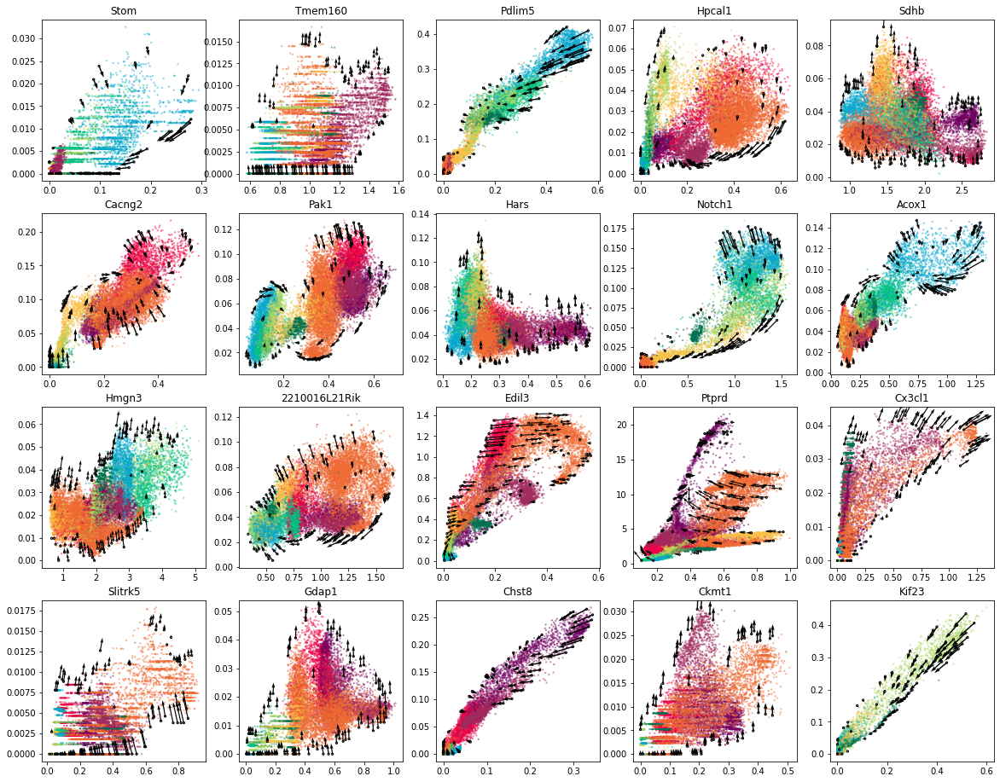

Rgs20
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


In [97]:
# gene velocity plot
ncols=5
height=math.ceil(len(gene_list)/5)*4

fig = plt.figure(figsize=(20,height))
for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer_rand20,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_neuro,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=gene_list[i])
    
    ax.set_title(gene_list[i])

plt.show()

In [37]:
rand20gene=list(load_cellDancer.gene_name.drop_duplicates()[0:20])

In [45]:
rand20gene

['Stom',
 'Tmem160',
 'Pdlim5',
 'Hpcal1',
 'Sdhb',
 'Cacng2',
 'Pak1',
 'Hars',
 'Notch1',
 'Acox1',
 'Hmgn3',
 '2210016L21Rik',
 'Edil3',
 'Ptprd',
 'Cx3cl1',
 'Slitrk5',
 'Gdap1',
 'Chst8',
 'Ckmt1',
 'Kif23']

Cacng2
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Gdap1
100
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Cx3cl1
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Acox1
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Rgs20
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
---------------------------------------

In [103]:
df_tmp=pd.DataFrame(load_raw_data.groupby(['gene_name'], sort=False)['u0'].max())

In [106]:
gene_select=list(df_tmp[df_tmp.u0>0.1].index)
gene_select

['Rgs20',
 'Eya1',
 'Stau2',
 'Kcnq5',
 'Rims1',
 'Ogfrl1',
 'Adgrb3',
 'Bend6',
 '2010300C02Rik',
 'Pantr1',
 'Fhl2',
 'Myo1b',
 'Gls',
 'Mfsd6',
 '1700019D03Rik',
 'Rftn2',
 'Fam126b',
 'Trak2',
 'Klf7',
 'Idh1',
 'Lancl1',
 'Erbb4',
 'Fn1',
 'March4',
 'Igfbp5',
 'Ptprn',
 'Epha4',
 'Serpine2',
 'Dock10',
 'Sphkap',
 'Pid1',
 'Dner',
 'Ngef',
 'Hjurp',
 'Kif1a',
 'Rnf152',
 'Dbi',
 'Actr3',
 'Tmem163',
 'Mcm6',
 'Srgap2',
 'Adora1',
 'Nav1',
 'Camsap2',
 'Lhx9',
 'Rgl1',
 'Cacna1e',
 'Fam163a',
 'Fam20b',
 'Ralgps2',
 'Brinp2',
 'Rabgap1l',
 'Prrx1',
 'Atp1b1',
 'Pea15a',
 'Atp1a2',
 'Cadm3',
 'Grem2',
 'Rgs7',
 'Tgfb2',
 'Cenpf',
 'Prox1',
 'Dtl',
 'Atp6v1h',
 'St18',
 '3110035E14Rik',
 'Prex2',
 'Paqr8',
 'B3gat2',
 'Khdrbs2',
 'Dst',
 'Arhgef4',
 'Inpp4a',
 'Tmeff2',
 'Spats2l',
 'Bmpr2',
 'Abi2',
 'Nrp2',
 'Zdbf2',
 'Adam23',
 'Unc80',
 'Arpc2',
 'Plcd4',
 'Acsl3',
 '2810459M11Rik',
 'Bok',
 'Cdh20',
 '2310035C23Rik',
 'Cntnap5a',
 'Mgat5',
 'Thsd7b',
 'Lrrn2',
 'Csrp1',
 'Kif21

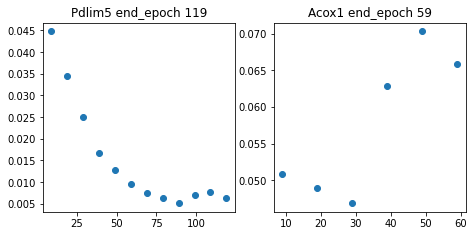

Rgs20
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Acox1
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Hpcal1
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Edil3
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Cx3cl1
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
---------------------------------------

In [51]:
gene_list_two=['Pdlim5','Acox1']
fig = plt.figure(figsize=(20,height))
for i in range(len(gene_list_two)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    onegene=brief_rand20[brief_rand20.gene_name==gene_list_two[i]]
    ax.scatter(onegene.epoch,onegene.loss)
    ax.set_title(gene_list_two[i]+' end_epoch '+str(list(onegene.epoch)[-1]))

## bin sample genes

In [94]:
%autoreload 2

max_epoches=200
check_n_epoch=10
learning_rate=0.001
downsample_method='neighbors'
step_i=200
step_j=200
sampling_ratio=0.5
n_neighbors=30
optimizer='Adam'
n_neighbors_downsample=30
auto_downsample=True
auto_norm_u_s=True
cost_type='smooth'
smooth_weight=0.1
patience=3
binning=True

# gene_list=load_raw_data.gene_name.drop_duplicates()
# gene_list=['Dcx','Ntrk2','Rimbp2','Dctn3','Psd3','Pfkp','Gnao1','Ncald','Klf7','Slc4a10','Elavl4','Gpc6','Cdh13','Ppfia2','Nav1']
#gene_list=['Ntrk2','Dcx','Nav1','Elavl4']

# gene_list=['Ntrk2','Dcx','Nav1','Elavl4']
# #gene_list=['Nav1']

gene_list=['Ntrk2','Rimbp2','Dctn3',\
            'Nav1','Psd3','Gnao1','Ncald','Klf7',\
            'Slc4a10','Ank2','Gpc6','Evl','Cdh13','Ppfia2',\
            'Astn1','Dcx','Plcb1','Nrxn1','Ppp1r14a','Ptpro',\
            'Tbc1d16','Slc1a3','Syt11']


# gene_list=list(load_raw_data.gene_name.drop_duplicates())
# gene_list=rand20gene
folder_name=("epoch"+str(max_epoches)+"check_n"+str(check_n_epoch)+"Lr"+str(learning_rate)+"Down"+str(downsample_method)+"_"+str(step_i)+"_"+str(step_j)+"Ratio"+str(sampling_ratio)+"N"+str(n_neighbors)+"O"+str(optimizer)+"nD"+str(n_neighbors_downsample)+"autoD"+str(auto_downsample)+"autoN"+str(auto_norm_u_s)+"costT"+str(cost_type)+"smoW"+str(smooth_weight)+"p"+str(patience)+"bin"+str(binning))

# result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/result_detailcsv/tunning_train/'+folder_name+'/'
# os.mkdir(result_path)
result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/tunning_train'

# Velocity Estimation
brief_sample_bin, load_cellDancer_sample_bin=velocity_estimation.train(load_raw_data,\
                                                 gene_choice=gene_list,\
                                                 max_epoches=max_epoches,\
                                                 check_n_epoch=check_n_epoch,\
                                                 learning_rate=learning_rate, \
                                                 downsample_method=downsample_method,\
                                                 step_i=step_i,\
                                                 step_j=step_j,\
                                                 sampling_ratio=sampling_ratio,\
                                                 n_neighbors=n_neighbors,\
                                                 optimizer=optimizer,\
                                                 n_neighbors_downsample=n_neighbors_downsample,\
                                                 auto_downsample=auto_downsample,\
                                                 auto_norm_u_s=auto_norm_u_s,\
                                                 cost_type=cost_type,\
                                                 smooth_weight=smooth_weight,\
                                                 patience=patience,\
                                                 binning=binning,\
                                                 result_path=result_path,n_jobs=8)




Using /Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/tunning_train/cell_dancer_velocity_2022-05-06 19-54-53 as the output path.
Klf7
100
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Ncald
100
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Astn1
100
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Rimbp2
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Nrxn1
100
branch

Velocity Estimation: 100%|████████████████████████| 1/1 [00:45<00:00, 45.01s/it]


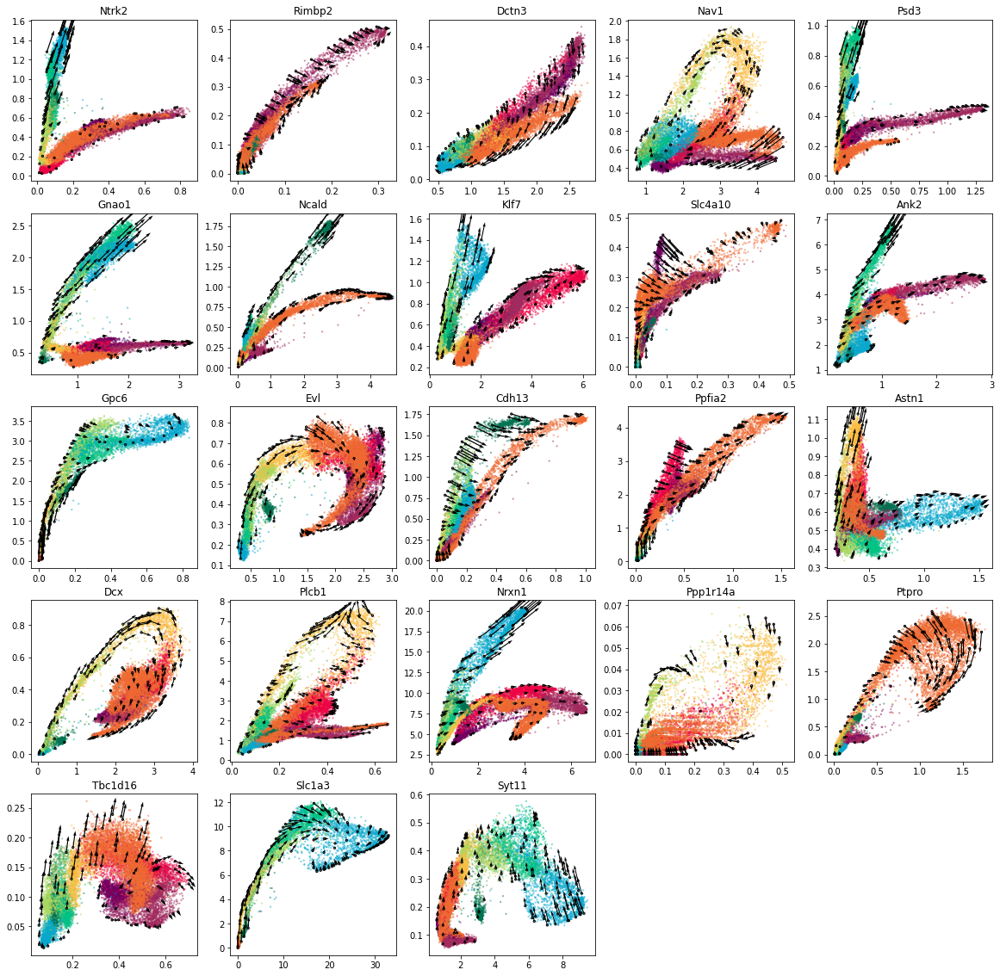

Evl
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Dctn3
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Tbc1d16
100
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Ncald
100
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Ptpro
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
-----------------------------------------

In [95]:
# gene velocity plot
ncols=5
height=math.ceil(len(gene_list)/5)*4

fig = plt.figure(figsize=(20,height))
for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer_sample_bin,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_neuro,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=gene_list[i])
    
    ax.set_title(gene_list[i])

plt.show()

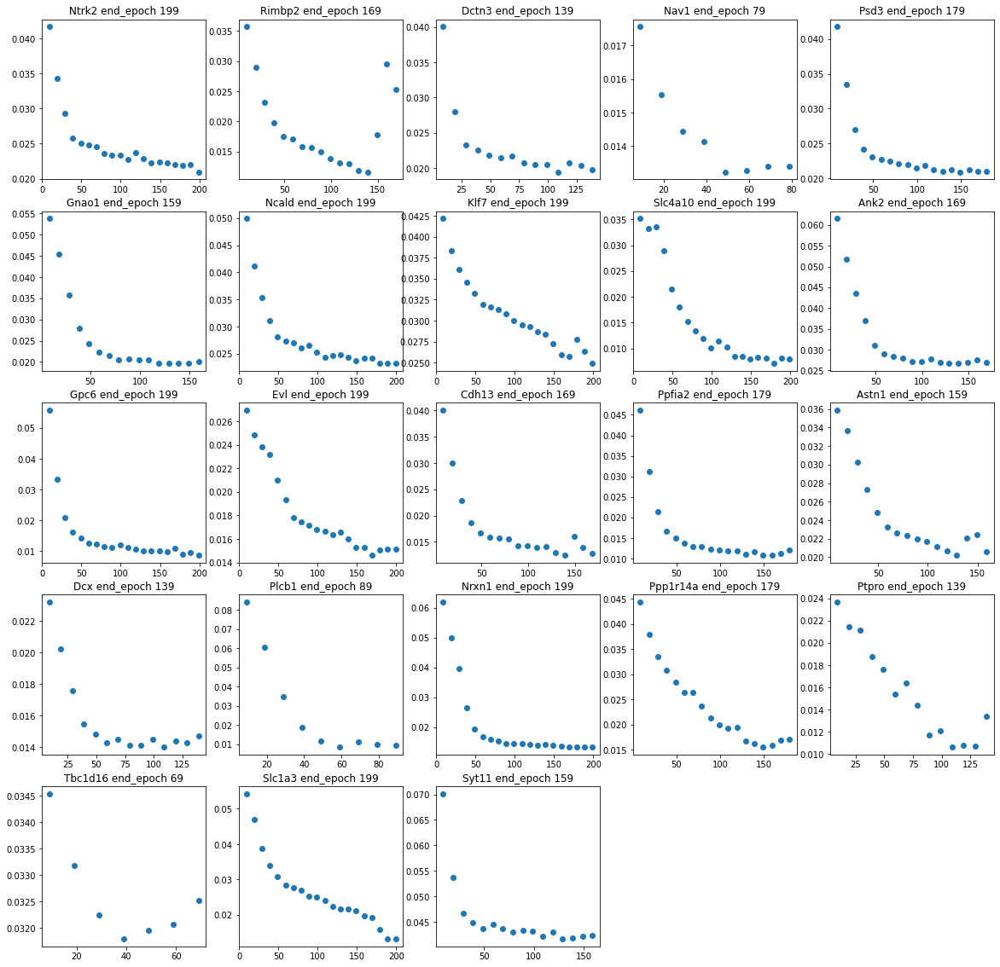

In [91]:
fig = plt.figure(figsize=(20,height))
for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    onegene=brief_sample_bin[brief_sample_bin.gene_name==gene_list[i]]
    ax.scatter(onegene.epoch,onegene.loss)
    ax.set_title(gene_list[i]+' end_epoch '+str(list(onegene.epoch)[-1]))

## bin sample genes - init

In [63]:
%autoreload 2

max_epoches=2
check_n_epoch=1
learning_rate=0.001
downsample_method='neighbors'
step_i=200
step_j=200
sampling_ratio=0.125
n_neighbors=30
optimizer='Adam'
n_neighbors_downsample=30
auto_downsample=True
auto_norm_u_s=True
cost_type='smooth'
smooth_weight=0.1
patience=3
binning=True

# gene_list=load_raw_data.gene_name.drop_duplicates()
# gene_list=['Dcx','Ntrk2','Rimbp2','Dctn3','Psd3','Pfkp','Gnao1','Ncald','Klf7','Slc4a10','Elavl4','Gpc6','Cdh13','Ppfia2','Nav1']
#gene_list=['Ntrk2','Dcx','Nav1','Elavl4']

# gene_list=['Ntrk2','Dcx','Nav1','Elavl4']
# #gene_list=['Nav1']

gene_list=['Ntrk2','Rimbp2','Dctn3',\
            'Nav1','Psd3','Gnao1','Ncald','Klf7',\
            'Slc4a10','Ank2','Gpc6','Evl','Cdh13','Ppfia2',\
            'Astn1','Dcx','Plcb1','Nrxn1','Ppp1r14a','Ptpro',\
            'Tbc1d16','Slc1a3','Syt11']


# gene_list=list(load_raw_data.gene_name.drop_duplicates())
# gene_list=rand20gene
folder_name=("epoch"+str(max_epoches)+"check_n"+str(check_n_epoch)+"Lr"+str(learning_rate)+"Down"+str(downsample_method)+"_"+str(step_i)+"_"+str(step_j)+"Ratio"+str(sampling_ratio)+"N"+str(n_neighbors)+"O"+str(optimizer)+"nD"+str(n_neighbors_downsample)+"autoD"+str(auto_downsample)+"autoN"+str(auto_norm_u_s)+"costT"+str(cost_type)+"smoW"+str(smooth_weight)+"p"+str(patience)+"bin"+str(binning))

# result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/result_detailcsv/tunning_train/'+folder_name+'/'
# os.mkdir(result_path)
result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/tunning_train'

# Velocity Estimation
brief_sample_bin_init, load_cellDancer_sample_bin_init=velocity_estimation.train(load_raw_data,\
                                                 gene_choice=gene_list,\
                                                 max_epoches=max_epoches,\
                                                 check_n_epoch=check_n_epoch,\
                                                 learning_rate=learning_rate, \
                                                 downsample_method=downsample_method,\
                                                 step_i=step_i,\
                                                 step_j=step_j,\
                                                 sampling_ratio=sampling_ratio,\
                                                 n_neighbors=n_neighbors,\
                                                 optimizer=optimizer,\
                                                 n_neighbors_downsample=n_neighbors_downsample,\
                                                 auto_downsample=auto_downsample,\
                                                 auto_norm_u_s=auto_norm_u_s,\
                                                 cost_type=cost_type,\
                                                 smooth_weight=smooth_weight,\
                                                 patience=patience,\
                                                 binning=binning,\
                                                 result_path=result_path,n_jobs=40)




Using /Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/tunning_train/cell_dancer_velocity_2022-05-06 17-50-57 as the output path.


Velocity Estimation: 100%|████████████████████████| 1/1 [00:15<00:00, 15.72s/it]


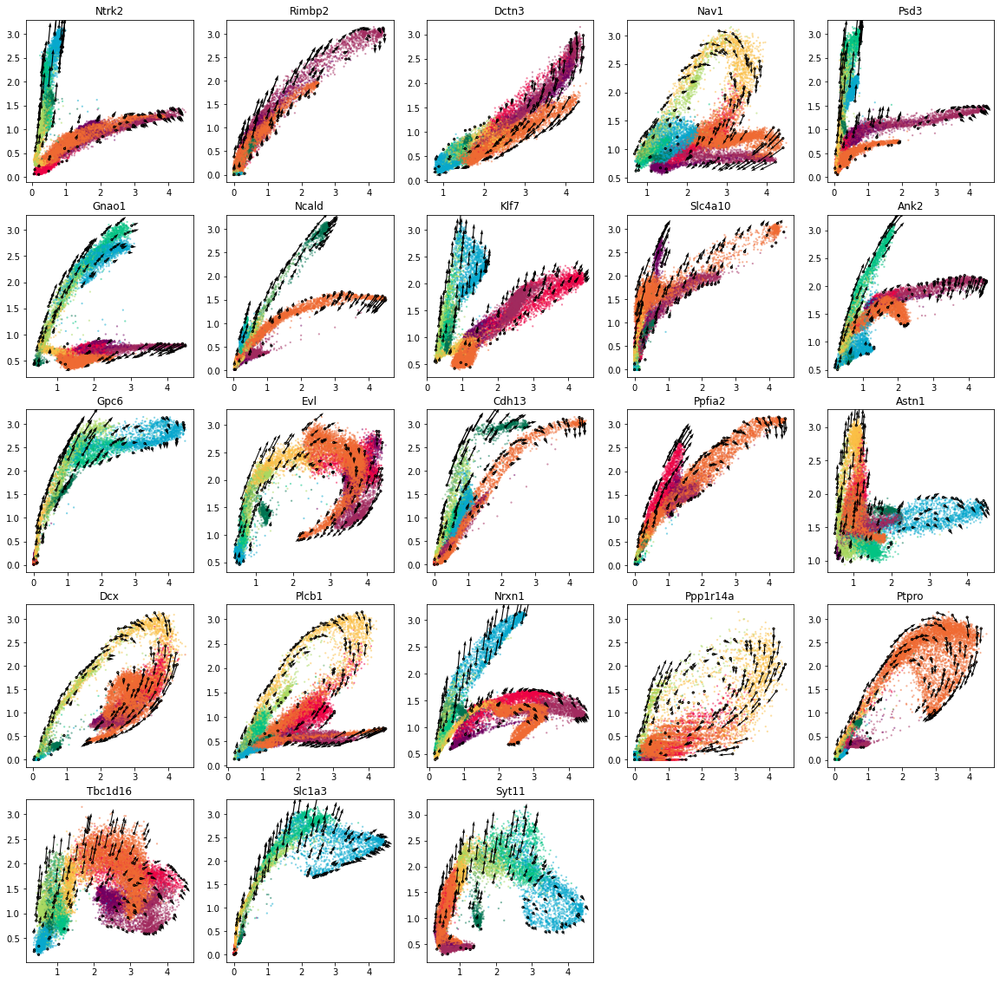

In [64]:
# gene velocity plot
ncols=5
height=math.ceil(len(gene_list)/5)*4

fig = plt.figure(figsize=(20,height))
for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer_sample_bin_init,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_neuro,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=gene_list[i])
    
    ax.set_title(gene_list[i])

plt.show()

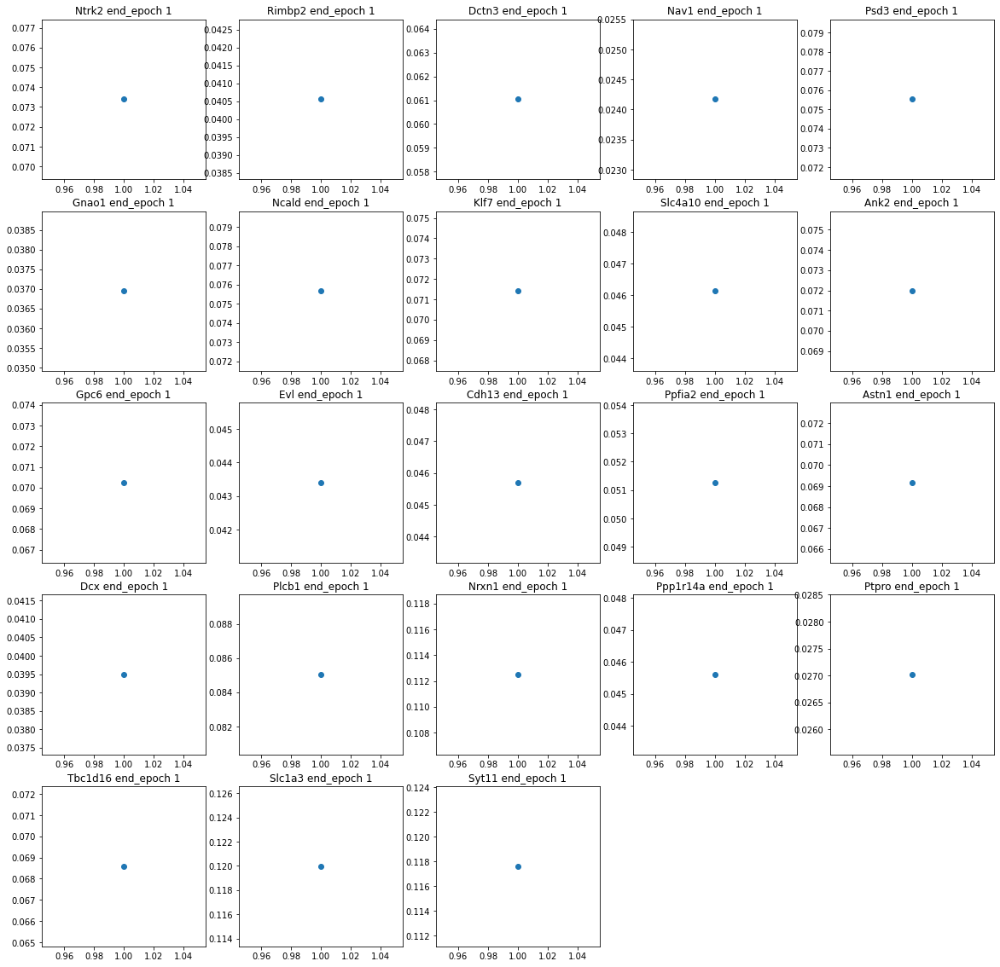

Rgs20
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Dcx
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Ank2
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Ncald
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Gpc6
100
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
---------------------------------------------

In [65]:
fig = plt.figure(figsize=(20,height))
for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    onegene=brief_sample_bin_init[brief_sample_bin_init.gene_name==gene_list[i]]
    ax.scatter(onegene.epoch,onegene.loss)
    ax.set_title(gene_list[i]+' end_epoch '+str(list(onegene.epoch)[-1]))

## Sample Genes' Velocity Plot

In [68]:

import numpy as np
np.round(0.12345, 2)

0.12

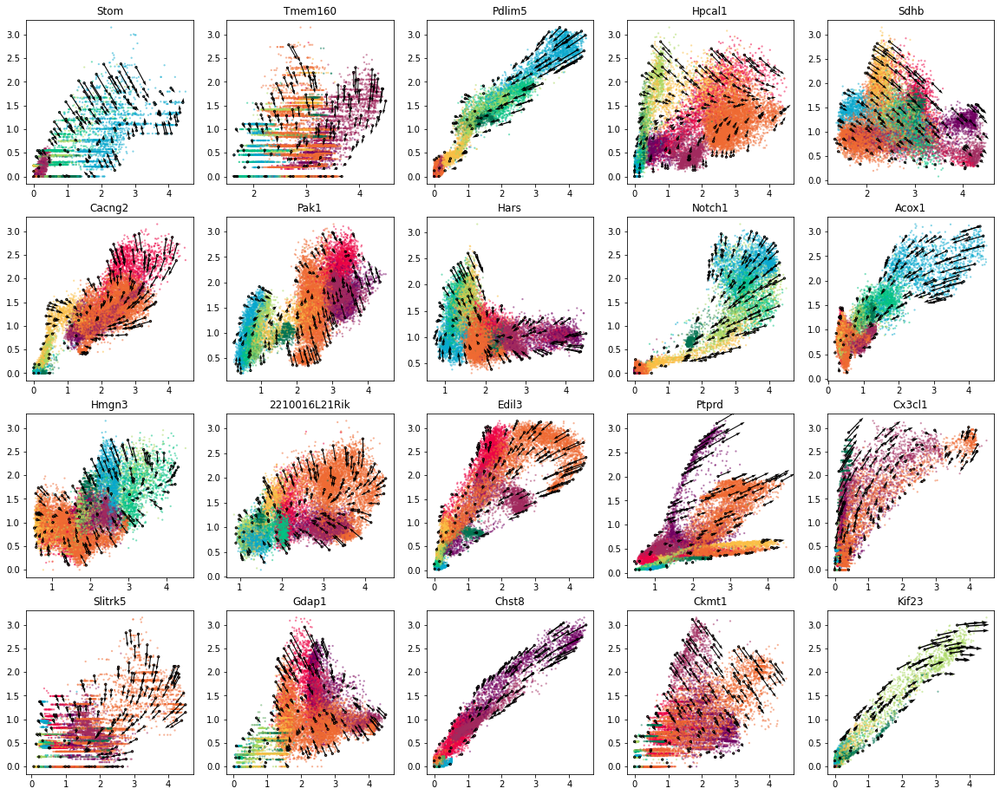

In [35]:
gene_list=['Ntrk2','Rimbp2','Dctn3',\
            'Nav1','Psd3','Gnao1','Ncald','Klf7',\
            'Slc4a10','Ank2','Gpc6','Evl','Cdh13','Ppfia2',\
            'Astn1','Dcx','Plcb1','Nrxn1','Ppp1r14a','Ptpro',\
            'Tbc1d16','Slc1a3','Syt11']
gene_list=list(load_cellDancer.gene_name.drop_duplicates()[0:20])
ncols=5
height=math.ceil(len(gene_list)/5)*4

# gene velocity plot
fig = plt.figure(figsize=(20,height))
for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_neuro,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=gene_list[i])
    
    ax.set_title(gene_list[i])

# loss plot
# fig = plt.figure(figsize=(20,height))
# for i in range(len(gene_list)):
#     ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
#     onegene=brief[brief.gene_name==gene_list[i]]
#     ax.scatter(onegene.epoch,onegene.loss)
#     ax.set_title(gene_list[i]+' end_epoch '+str(list(onegene.epoch)[-1]))
    
plt.show()

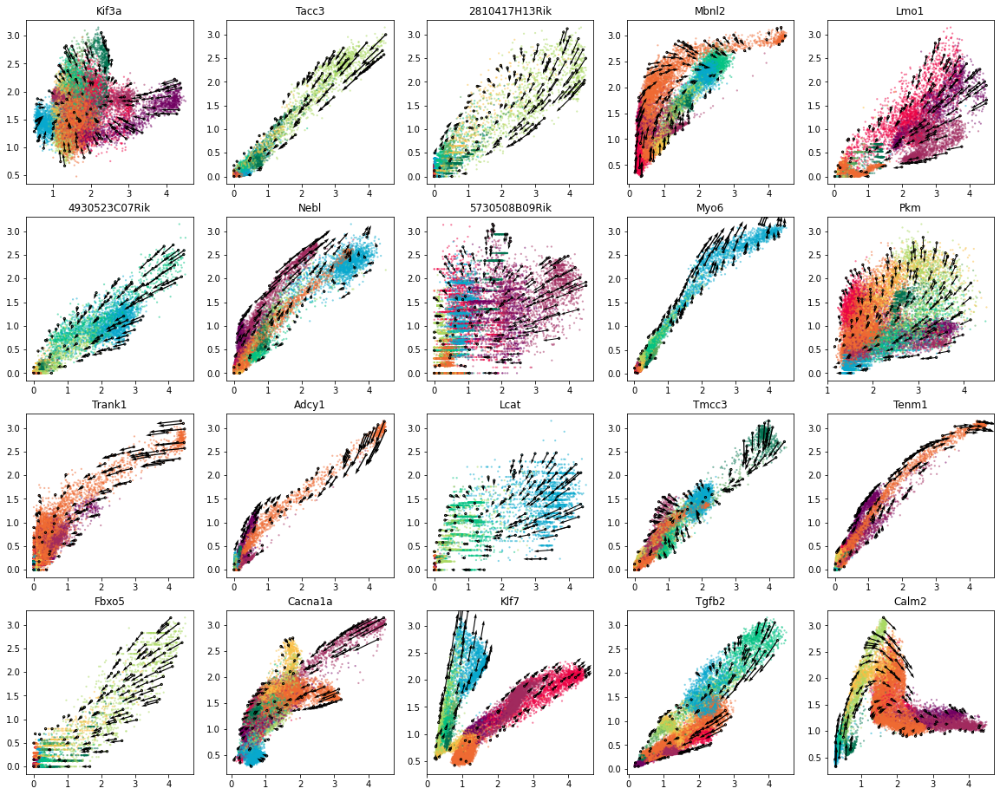

In [36]:
gene_list=['Ntrk2','Rimbp2','Dctn3',\
            'Nav1','Psd3','Gnao1','Ncald','Klf7',\
            'Slc4a10','Ank2','Gpc6','Evl','Cdh13','Ppfia2',\
            'Astn1','Dcx','Plcb1','Nrxn1','Ppp1r14a','Ptpro',\
            'Tbc1d16','Slc1a3','Syt11']
gene_list=list(load_cellDancer.gene_name.drop_duplicates()[20:40])
ncols=5
height=math.ceil(len(gene_list)/5)*4

# gene velocity plot
fig = plt.figure(figsize=(20,height))
for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_neuro,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=gene_list[i])
    
    ax.set_title(gene_list[i])

# loss plot
# fig = plt.figure(figsize=(20,height))
# for i in range(len(gene_list)):
#     ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
#     onegene=brief[brief.gene_name==gene_list[i]]
#     ax.scatter(onegene.epoch,onegene.loss)
#     ax.set_title(gene_list[i]+' end_epoch '+str(list(onegene.epoch)[-1]))
    
plt.show()

## Load velocity estimation result of 2000 genes

In [4]:
#detail_file = '/Users/shengyuli/Library/CloudStorage/OneDrive-HoustonMethodist/work/Velocity/data/Gastrulation/velocity_result/result_detailcsv/2000genes_with_bin_and_smooth/combined_detail/combined_detail.csv'
detail_file = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/result_detailcsv/tunning_train/epoch200check_n10Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNTruecostTsmoothsmoW0.1p3binTrue/cell_dancer_velocity_2022-05-03 18-49-21/celldancer_estimation.csv'

output_path = os.getcwd()
load_cellDancer=pd.read_csv(detail_file)
load_cellDancer

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,loss,cellID,clusters,embedding1,embedding2
0,0,Ift81,0.026321,0.010658,0.029678,0.009281,0.024614,0.043046,0.072913,0.039428,cell_363,Blood progenitors 2,3.460521,15.574629
1,1,Ift81,0.044266,0.000000,0.037986,0.000994,0.021712,0.043374,0.073363,0.039428,cell_382,Blood progenitors 2,2.490433,14.971734
2,2,Ift81,0.064559,0.000000,0.055336,0.000936,0.020447,0.043307,0.073875,0.039428,cell_385,Blood progenitors 2,2.351203,15.267069
3,3,Ift81,0.020756,0.000000,0.017835,0.001063,0.023218,0.043451,0.072763,0.039428,cell_393,Blood progenitors 2,5.899098,14.388825
4,4,Ift81,0.013184,0.000000,0.011334,0.001085,0.023697,0.043477,0.072567,0.039428,cell_398,Blood progenitors 2,4.823139,15.374831
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24657995,12324,Mcrip1,1.128435,0.000000,1.126852,0.000080,0.003006,0.043029,0.008092,0.052719,cell_139318,Erythroid3,8.032358,7.603037
24657996,12325,Mcrip1,0.970672,0.024356,1.468201,0.015411,0.009476,0.040149,0.009596,0.052719,cell_139321,Erythroid3,10.352904,6.446736
24657997,12326,Mcrip1,0.899107,0.000000,0.897765,0.000097,0.003658,0.042447,0.008614,0.052719,cell_139326,Erythroid3,9.464873,7.261099
24657998,12327,Mcrip1,1.398107,0.017375,1.764710,0.010764,0.006875,0.041571,0.008628,0.052719,cell_139327,Erythroid3,9.990495,7.243880


In [79]:

is_NaN = load_cellDancer[['alpha','beta']].isnull()
row_has_NaN = is_NaN. any(axis=1)
rows_with_NaN = load_cellDancer[['alpha','beta']][row_has_NaN]
print(rows_with_NaN)

Empty DataFrame
Columns: [alpha, beta]
Index: []


In [23]:
load_cellDancer_sample=load_cellDancer[load_cellDancer.gene_name.isin(gene_list)].reset_index(drop=True)

## Compute Cell Velocity and Estimate Pseudotime

In [114]:
load_cellDancer_filtered=load_cellDancer[load_cellDancer.gene_name.isin(gene_select)].reset_index(drop=True)

In [111]:
gene_l=list(load_cellDancer_filtered.gene_name.drop_duplicates())


In [117]:
# Set Parameters
n_neighbors=200
downsample_step=(60,60)
mode='embedding'
transfer_mode=None

# Compute Cell Velocity
gene_choice=list(set(load_cellDancer.gene_name))
compute_cell_velocity(load_cellDancer=load_cellDancer_filtered,
            #  gene_list=gene_l,
              mode=mode,
              transfer_mode=transfer_mode,
              n_neighbors=n_neighbors,
              step=downsample_step)

KeyboardInterrupt: 

In [118]:
load_cellDancer_filtered

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,loss,cellID,clusters,embedding1,embedding2,index,velocity1,velocity2
0,0,Pdlim5,0.090324,0.078271,0.091498,0.184278,0.261462,0.631769,0.521470,0.078743,10X83_2:AAACGGGGTCTCTTTAx,ImmGranule2,18.931086,-1.862429,0,NaN,NaN
1,1,Pdlim5,0.094504,0.097653,0.100672,0.200087,0.266488,0.630997,0.521498,0.078743,10X83_2:AACCATGGTTCAACCAx,ImmGranule2,18.419891,-1.282895,1,NaN,NaN
2,2,Pdlim5,0.136376,0.239334,0.175654,0.311571,0.294334,0.626157,0.522858,0.078743,10X83_2:AACACGTTCTGAAAGAx,CA2-3-4,2.369887,16.868419,2,NaN,NaN
3,3,Pdlim5,0.065395,0.000000,0.048352,0.120593,0.241186,0.634739,0.521236,0.078743,10X83_2:AAAGATGCATTGAGCTx,CA,-5.351040,10.676485,3,NaN,NaN
4,4,Pdlim5,0.049597,0.000000,0.036692,0.122335,0.244671,0.634525,0.520397,0.078743,10X83_2:AACCATGTCTACTTACx,CA1-Sub,-6.189126,11.754900,4,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26810915,18135,Prmt8,1.038846,1.077543,1.021410,1.027502,0.467730,0.526952,0.580148,0.089323,10X84_3:TTTCCTCCACCATCCTx,ImmGranule1,10.812611,-2.487668,18135,NaN,NaN
26810916,18136,Prmt8,2.101256,1.635571,1.854038,1.317074,0.200809,0.512238,0.634020,0.089323,10X84_3:TTTGTCACATGAAGTAx,CA2-3-4,8.246204,23.482788,18136,NaN,NaN
26810917,18137,Prmt8,0.838344,1.425215,0.968051,1.322800,0.539824,0.522486,0.578808,0.089323,10X84_3:TTTCCTCCACGGTAAGx,nIPC,-3.441272,-4.917364,18137,NaN,NaN
26810918,18138,Prmt8,1.336118,1.783790,1.387575,1.509269,0.368128,0.514169,0.609419,0.089323,10X84_3:TTTGTCAAGCGTCAAGx,ImmGranule2,16.394199,-6.143549,18138,NaN,NaN


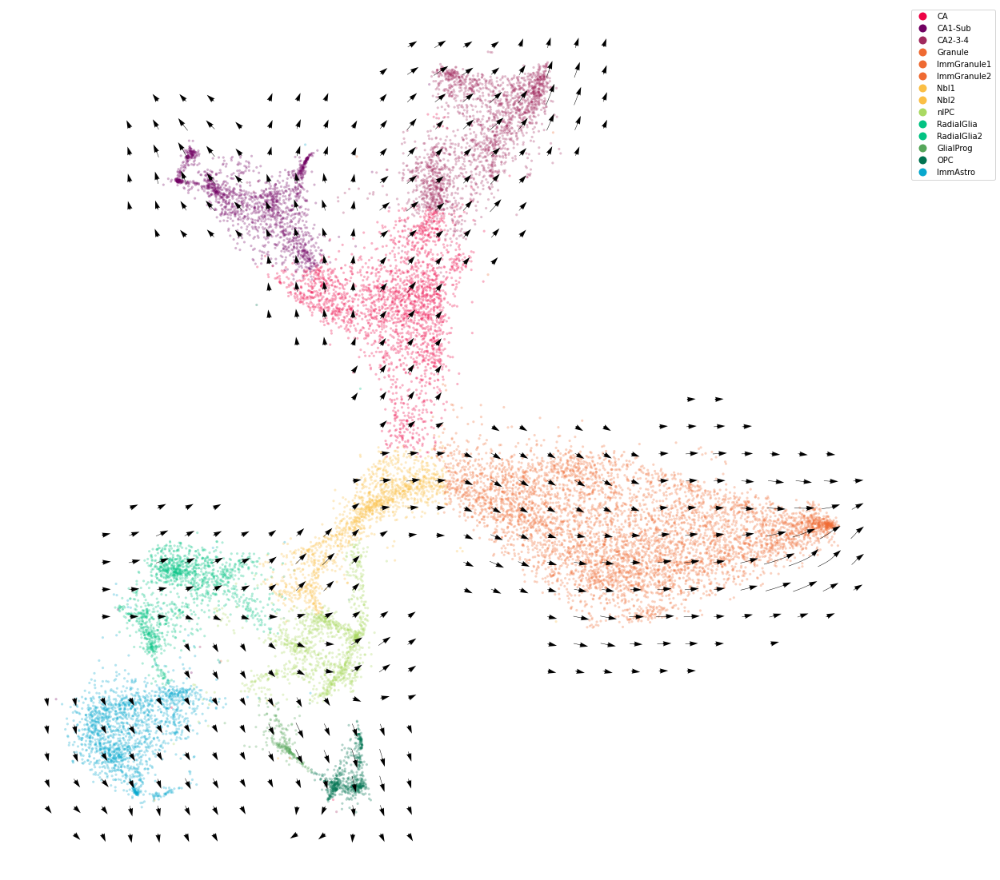

In [121]:
# Set Parameters
min_mass=0.01
grid_steps=(30,30)
alpha_inside=0.3


fig, ax = plt.subplots(figsize=(20,20))
im = cdplt.cell.scatter_cell(ax,load_cellDancer_filtered, colors=colormap.colormap_neuro, alpha=alpha_inside, s=10,
             velocity=True, legend='on',min_mass=min_mass,grid_steps=grid_steps)
ax.axis('off')
plt.show()

In [86]:
load_cellDancer.max

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,loss,cellID,clusters,embedding1,embedding2,index,velocity1,velocity2
0,0,Stom,0.096336,0.000000,0.072797,0.189887,0.379775,0.698080,0.488693,0.074582,10X83_2:AAACGGGGTCTCTTTAx,ImmGranule2,18.931086,-1.862429,0,NaN,NaN
1,1,Stom,0.096336,0.000000,0.072797,0.189887,0.379775,0.698080,0.488693,0.074582,10X83_2:AACCATGGTTCAACCAx,ImmGranule2,18.419891,-1.282895,1,NaN,NaN
2,2,Stom,0.127639,0.000000,0.096327,0.179747,0.359494,0.701801,0.490635,0.074582,10X83_2:AACACGTTCTGAAAGAx,CA2-3-4,2.369887,16.868419,2,NaN,NaN
3,3,Stom,0.000000,0.000000,0.000000,0.223987,0.447975,0.686587,0.482727,0.074582,10X83_2:AAAGATGCATTGAGCTx,CA,-5.351040,10.676485,3,NaN,NaN
4,4,Stom,0.000000,0.000000,0.000000,0.223987,0.447975,0.686587,0.482727,0.074582,10X83_2:AACCATGTCTACTTACx,CA1-Sub,-6.189126,11.754900,4,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39164255,18135,Prmt8,1.038846,1.077543,1.021410,1.027502,0.467730,0.526952,0.580148,0.089323,10X84_3:TTTCCTCCACCATCCTx,ImmGranule1,10.812611,-2.487668,18135,NaN,NaN
39164256,18136,Prmt8,2.101256,1.635571,1.854038,1.317074,0.200809,0.512238,0.634020,0.089323,10X84_3:TTTGTCACATGAAGTAx,CA2-3-4,8.246204,23.482788,18136,NaN,NaN
39164257,18137,Prmt8,0.838344,1.425215,0.968051,1.322800,0.539824,0.522486,0.578808,0.089323,10X84_3:TTTCCTCCACGGTAAGx,nIPC,-3.441272,-4.917364,18137,NaN,NaN
39164258,18138,Prmt8,1.336118,1.783790,1.387575,1.509269,0.368128,0.514169,0.609419,0.089323,10X84_3:TTTGTCAAGCGTCAAGx,ImmGranule2,16.394199,-6.143549,18138,NaN,NaN


## Estimate Pseudotime

In [7]:
%%capture
cell_time = dict()
dt = 0.01
t_total = {dt:int(10/dt)} 
n_repeats = 10
grid = (20,20)
pseudo_time(load_cellDancer, grid, dt, t_total[dt], n_repeats, downsample_step)

## Plot Pseudotime

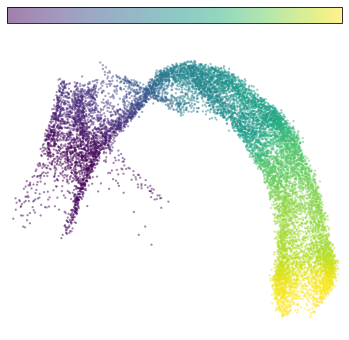

In [8]:
fig, ax = plt.subplots(figsize=(6,6))
clusters = load_cellDancer['clusters'].drop_duplicates().to_list()
im=cdplt.cell.scatter_cell(ax,load_cellDancer, colors='pseudotime', alpha=0.5, 
             velocity=False, custom_xlim=(-5,11), custom_ylim=(4,18))
ax.axis('off')
plt.show()

## Gene Pseudotime

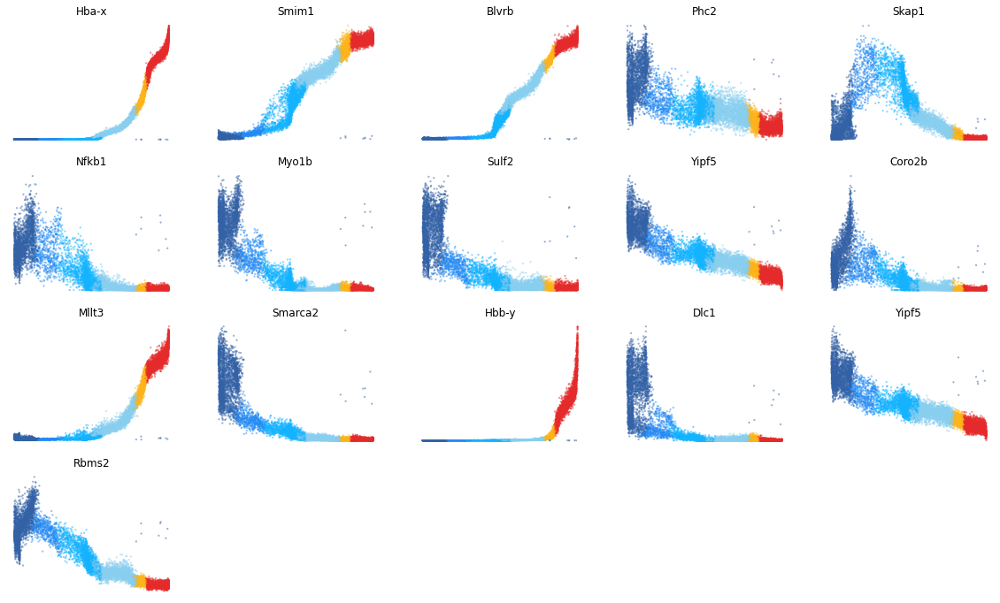

In [9]:
ncols=5
fig = plt.figure(figsize=(20,12))
for i in range(len(gene_list)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='pseudotime',
        y='spliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=False,
        gene_name=gene_list[i])

    ax.set_title(gene_list[i])
    ax.axis('off')

In [10]:
murk_gene_pd=pd.read_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/MURK_genes/13059_2021_2414_MOESM3_ESM.csv')
murk_gene_list=list(murk_gene_pd['index'])

In [11]:
# Set Parameters
n_neighbors=10
downsample_step=(100,100)
mode='gene'
transfer_mode='power10'
min_mass=15
grid_steps=(20,20)
custom_xlim=[-6,13]
custom_ylim=[2,16]
alpha_inside=0.3

# Compute Cell Velocity
compute_cell_velocity(load_cellDancer=load_cellDancer,
              gene_list=murk_gene_list,
              mode=mode,
              transfer_mode=transfer_mode,
              n_neighbors=n_neighbors,
              step=downsample_step)

(genes, cells): (2000, 12329)
Caution! Overwriting the 'velocity' columns.
After downsampling, there are  951 cells.


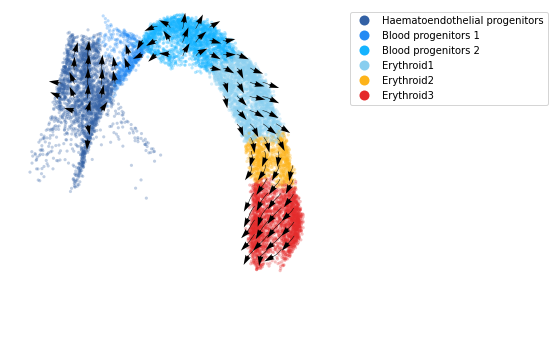

In [12]:
fig, ax = plt.subplots(figsize=(6,6))
im = cdplt.cell.scatter_cell(ax,load_cellDancer, colors=colormap.colormap_erythroid, alpha=alpha_inside, s=10,
             velocity=True, custom_xlim=custom_xlim, custom_ylim=custom_ylim, legend='on',min_mass=min_mass,grid_steps=grid_steps)
ax.axis('off')
plt.show()

In [ ]:
# alpha beta gamma cluster

## Gene Velocity by Cost Rank

In [13]:
loss_list=load_cellDancer[['gene_name','loss']].groupby(['gene_name']).mean()
loss_list_rank=loss_list.sort_values('loss')
loss_list_rank_low_20=list(loss_list_rank.index[0:20])
loss_list_rank_high_20=list(loss_list_rank.index[-20:])
loss_list_rank_low_300to320=list(loss_list_rank.index[300:320])
loss_list_rank_high_300to320=list(loss_list_rank.index[-320:-300])

In [14]:
loss_list_rank

,loss
gene_name,
Gzmf,0.009423
Scai,0.011870
Gzmg,0.014455
Golga1,0.015978
Brip1,0.017405
...,...
Ccnd1,0.649647
Id1,0.672909
Cdx2,0.673724


## low cost 20

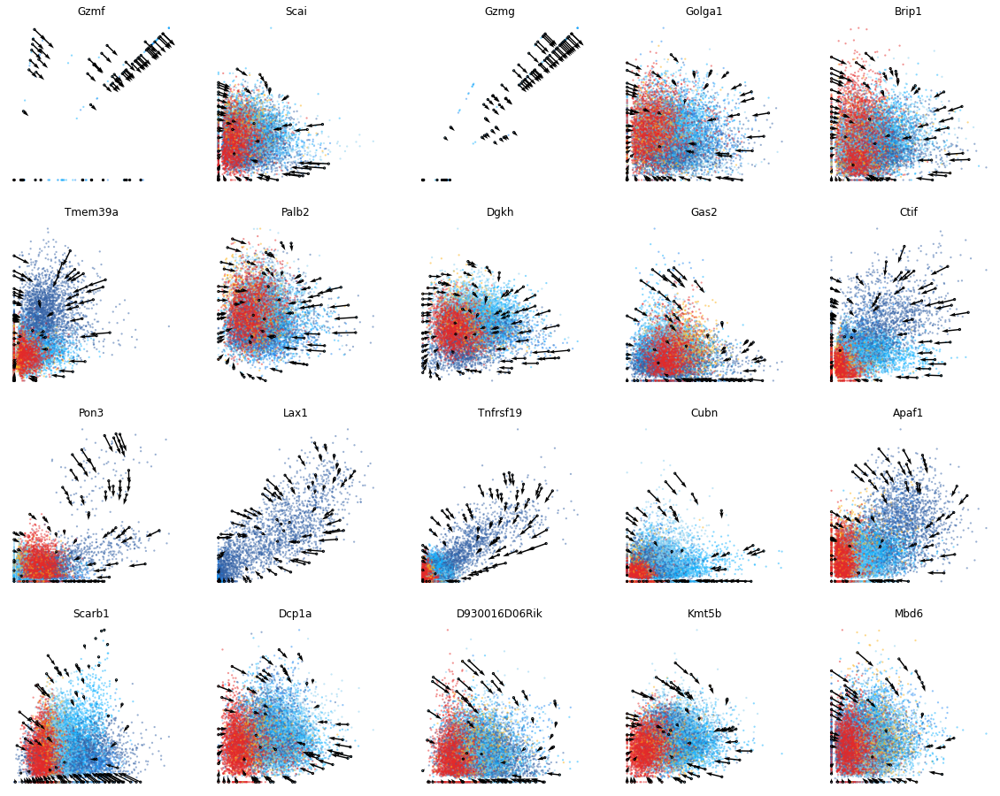

In [15]:
# Gene Velocity Plot - loss_list_rank_top_20 (low)

ncols=5
fig = plt.figure(figsize=(20,16))

for i in range(len(loss_list_rank_low_20)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=loss_list_rank_low_20[i])
    
    ax.set_title(loss_list_rank_low_20[i])
    ax.axis('off')

plt.show()

## high cost 20

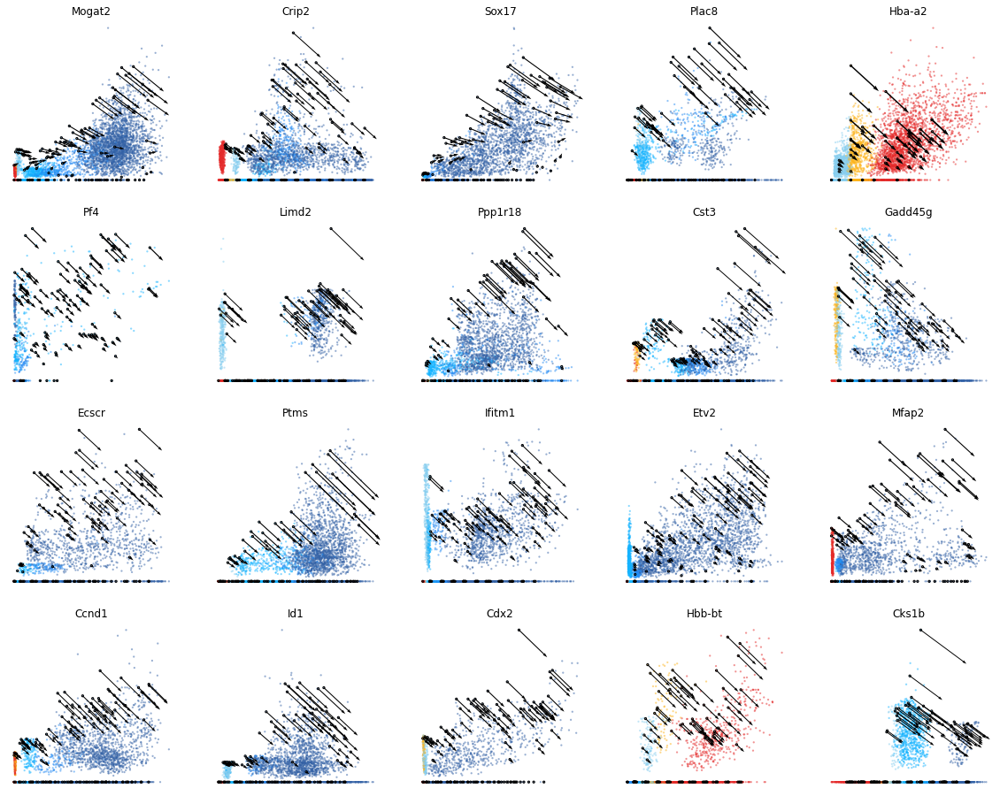

In [16]:
# Gene Velocity Plot - loss_list_rank_last_20 (high)

ncols=5
fig = plt.figure(figsize=(20,16))

for i in range(len(loss_list_rank_high_20)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=loss_list_rank_high_20[i])
    
    ax.set_title(loss_list_rank_high_20[i])
    ax.axis('off')

plt.show()

## loss_list_rank_low_300to320

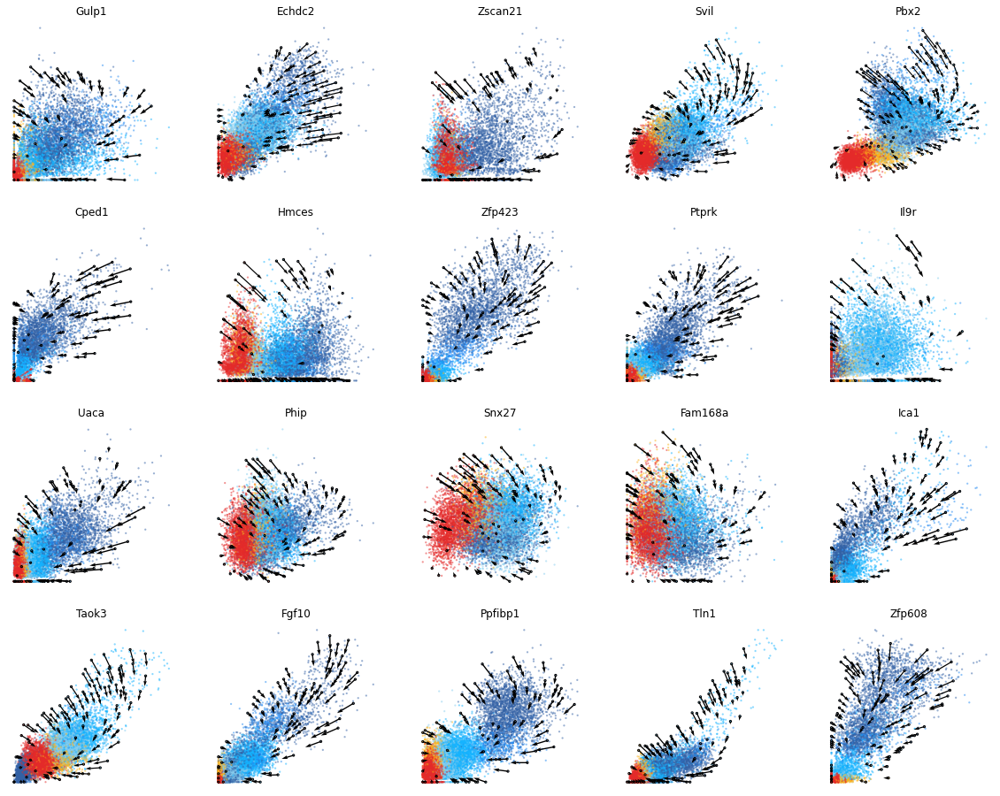

In [17]:
# Gene Velocity Plot - loss_list_rank_last_20 (high)

ncols=5
fig = plt.figure(figsize=(20,16))

for i in range(len(loss_list_rank_low_300to320)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=loss_list_rank_low_300to320[i])
    
    ax.set_title(loss_list_rank_low_300to320[i])
    ax.axis('off')

plt.show()

## loss_list_rank_high_300to320

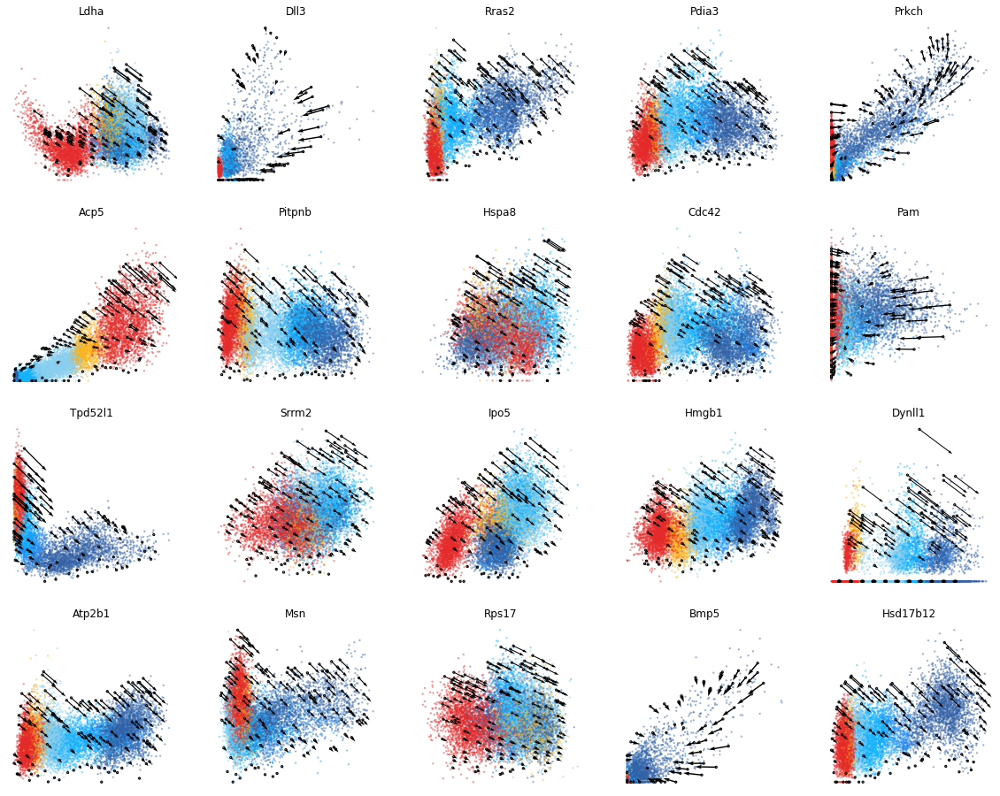

In [18]:
# Gene Velocity Plot - loss_list_rank_last_20 (high)

ncols=5
fig = plt.figure(figsize=(20,16))

for i in range(len(loss_list_rank_high_300to320)):
    ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    cdplt.gene.scatter_gene(
        ax=ax,
        x='spliced',
        y='unspliced',
        load_cellDancer=load_cellDancer,
        save_path=None,
        custom_xlim=None,
        custom_ylim=None,
        colors=colormap.colormap_erythroid,
        alpha=0.5, 
        s = 5,
        velocity=True,
        gene_name=loss_list_rank_high_300to320[i])
    
    ax.set_title(loss_list_rank_high_300to320[i])
    ax.axis('off')

plt.show()

## UMAP using alpha, beta, and gamma

In [26]:
load_cellDancer=cdplt.cell.calculate_para_umap(load_cellDancer,'alpha')

OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [27]:
load_cellDancer=cdplt.cell.calculate_para_umap(load_cellDancer,'beta')

In [28]:
load_cellDancer=cdplt.cell.calculate_para_umap(load_cellDancer,'gamma')

In [29]:
load_cellDancer=cdplt.cell.calculate_para_umap(load_cellDancer,'alpha_beta_gamma')

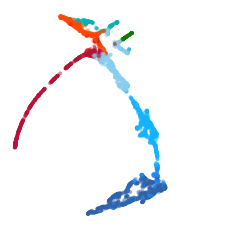

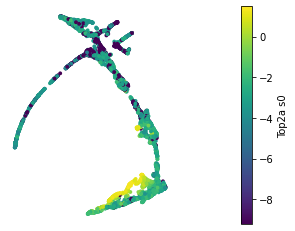

In [49]:
cdplt.cell.plot_para_umap('alpha',load_cellDancer,cluster_map=cdplt.colormap.colormap_pancreas ,save_path=None,title=None)
cdplt.cell.plot_para_umap('alpha',load_cellDancer,gene_name='Top2a',cluster_map=cdplt.colormap.colormap_pancreas ,save_path=None,title=None)

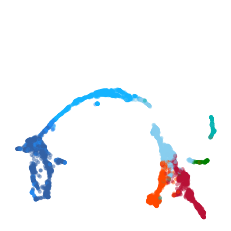

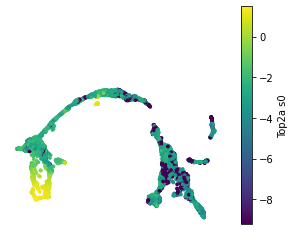

In [50]:
cdplt.cell.plot_para_umap('beta',load_cellDancer,cluster_map=cdplt.colormap.colormap_pancreas ,save_path=None,title=None)
cdplt.cell.plot_para_umap('beta',load_cellDancer,gene_name='Top2a',cluster_map=cdplt.colormap.colormap_pancreas ,save_path=None,title=None)

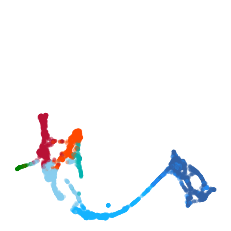

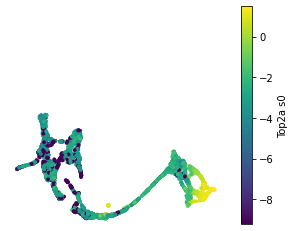

In [51]:
cdplt.cell.plot_para_umap('gamma',load_cellDancer,cluster_map=cdplt.colormap.colormap_pancreas ,save_path=None,title=None)
cdplt.cell.plot_para_umap('gamma',load_cellDancer,gene_name='Top2a',cluster_map=cdplt.colormap.colormap_pancreas ,save_path=None,title=None)

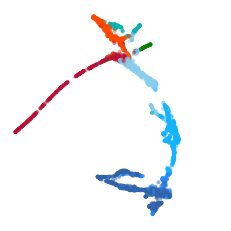

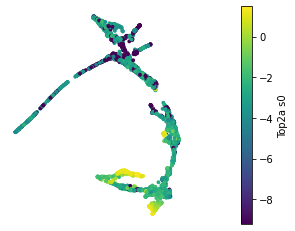

In [52]:
cdplt.cell.plot_para_umap('alpha_beta_gamma',load_cellDancer,cluster_map=cdplt.colormap.colormap_pancreas ,save_path=None,title=None)
cdplt.cell.plot_para_umap('alpha_beta_gamma',load_cellDancer,gene_name='Top2a',cluster_map=cdplt.colormap.colormap_pancreas ,save_path=None,title=None)

# test

In [13]:
%autoreload 2

max_epoches=300
check_n_epoch=10
learning_rate=0.001#0.001
downsample_method='neighbors'
step_i=200
step_j=200
sampling_ratio=0.125 #0.125
n_neighbors=30
optimizer='Adam'
n_neighbors_downsample=30
auto_downsample=True
auto_norm_u_s=True
cost_type='smooth'
smooth_weight=0.1#0.1
patience=2
binning=False

def velocity_calc(load_raw_data,gene_list):
    # gene_list=load_raw_data.gene_name.drop_duplicates()
    # gene_list=['Dcx','Rimbp2','Dctn3','Psd3','Ntrk2','Pfkp','Gnao1','Ncald','Klf7','Slc4a10','Nav1','Elavl4','Gpc6','Cdh13','Ppfia2']
    # gene_list=['Ntrk2','Dcx','Nav1','Elavl4']



    folder_name=("epoch"+str(max_epoches)+"check_n"+str(check_n_epoch)+"Lr"+str(learning_rate)+"Down"+str(downsample_method)+"_"+str(step_i)+"_"+str(step_j)+"Ratio"+str(sampling_ratio)+"N"+str(n_neighbors)+"O"+str(optimizer)+"nD"+str(n_neighbors_downsample)+"autoD"+str(auto_downsample)+"autoN"+str(auto_norm_u_s)+"costT"+str(cost_type)+'avgW'+str(average_cost_window_size)+"smoW"+str(smooth_weight)+"p"+str(patience)+"bin"+str(binning))
    print(folder_name)
    # result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/result_detailcsv/tunning_train/'+folder_name+'/'
    # os.mkdir(result_path)
    result_path = None

    # Velocity Estimation
    brief, load_cellDancer=velocity_estimation.train(load_raw_data,\
                                                     gene_choice=gene_list,\
                                                     max_epoches=max_epoches,\
                                                     check_n_epoch=check_n_epoch,\
                                                     learning_rate=learning_rate, \
                                                     downsample_method=downsample_method,\
                                                     step_i=step_i,\
                                                     step_j=step_j,\
                                                     sampling_ratio=sampling_ratio,\
                                                     n_neighbors=n_neighbors,\
                                                     optimizer=optimizer,\
                                                     n_neighbors_downsample=n_neighbors_downsample,\
                                                     auto_downsample=auto_downsample,\
                                                     auto_norm_u_s=auto_norm_u_s,\
                                                     cost_type=cost_type,\
                                                     average_cost_window_size=average_cost_window_size,\
                                                     smooth_weight=smooth_weight,\
                                                     patience=patience,\
                                                     binning=binning,\
                                                     result_path=result_path,n_jobs=5)
    for gene in gene_list:
        onegene=brief[brief.gene_name==gene]
        plt.figure()
        plt.scatter(onegene.epoch,onegene.loss)
        plt.title(gene)
        plt.show()
    
    #onegene.loss
    ## Sample Genes' Velocity Plot
#     for gene in gene_list:
#         onegene=load_cellDancer[load_cellDancer.gene_name==gene]
#     plt.quiver(onegene.s0,onegene.u0,onegene.s1-onegene.s0,onegene.u1-onegene.u0,)
    
    ncols=5
    fig = plt.figure(figsize=(20,4))

    for i in range(len(gene_list)):
        ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
        cdplt.gene.scatter_gene(
            ax=ax,
            x='spliced',
            y='unspliced',
            load_cellDancer=load_cellDancer,
            save_path=None,
            custom_xlim=None,
            custom_ylim=None,
            colors=colormap.colormap_neuro,
            alpha=0.5, 
            s = 5,
            velocity=True,
            gene_name=gene_list[i])
        gene=gene_list[i]
        onegene=brief[brief.gene_name==gene]
        end_epoch=str(list(onegene.epoch)[-1])
        ax.set_title(gene_list[i]+' stop epoch '+end_epoch)
    
    plt.savefig('/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/debug_circle/'+folder_name+'.pdf')

In [273]:
nav1_10=nav1_10.reset_index(drop=True)

In [287]:
dcx_10=dcx_10.reset_index(drop=True)

epoch300check_n10Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNFalsecostTaverageavgW10smoW0.1p3binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/NEURO_sl/cell_dancer_velocity_2022-05-05 21-30-25 as the output path.
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------

Velocity Estimation: 100%|████████████████████████| 1/1 [00:13<00:00, 13.68s/it]


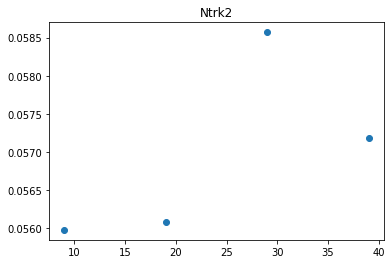

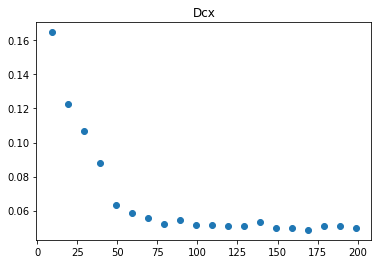

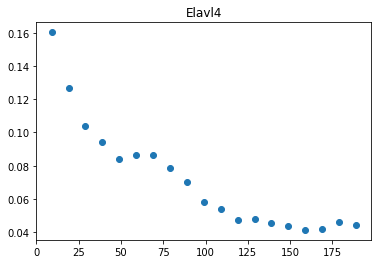

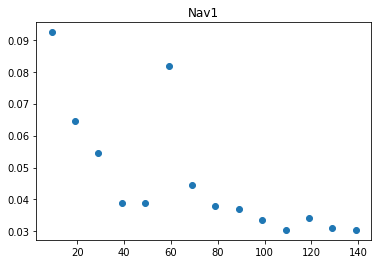

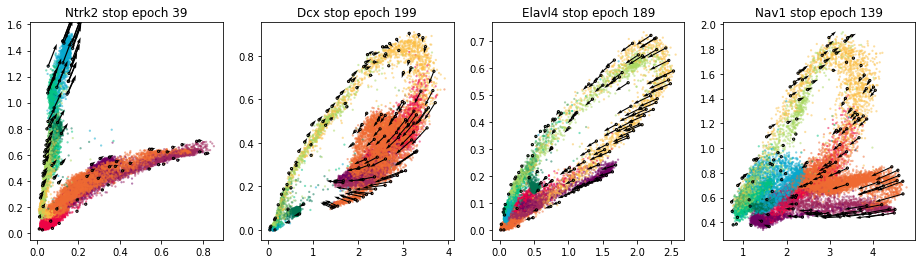

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


In [14]:
%autoreload 2
gene_list=['Ntrk2','Dcx','Elavl4','Nav1']
for max_epoches in [300]:
    for check_n_epoch in [10]:
        for learning_rate in [0.001]:
            for downsample_method in ['neighbors']:
                for step_i in [200]:
                    for step_j in [200]:
                        for sampling_ratio in [0.125]:#[0.125]:
                            for n_neighbors in [30]:#[30]:
                                for optimizer in ['Adam']:
                                    for n_neighbors_downsample in [30]:
                                        for auto_downsample in [True]:
                                            for auto_norm_u_s in [False]:
                                                for cost_type in ['average']:#,'average','median']:
                                                    for average_cost_window_size in [10]:
                                                        for smooth_weight in [0.1]:#,0.8,0.7,0.6]:#0.1
                                                            for patience in [3]:
                                                                for binning in [False]:
                                                                    velocity_calc(load_raw_data,gene_list)

In [335]:
dcx_5.max(0)

cellIndex                           536
gene_name                           Dcx
s0                             0.278866
u0                             0.166221
s1                             0.310236
u1                             0.156922
alpha                          0.096125
beta                           0.692857
gamma                          0.166925
loss                           0.189853
cellID        10X83_2:AGATCTGGTACGCACCx
clusters                           nIPC
embedding1                    -3.127282
embedding2                    -2.569951
dtype: object

In [333]:
dcx_10.max(0)

cellIndex                           822
gene_name                           Dcx
s0                             0.278866
u0                             0.166221
s1                             0.310236
u1                             0.156922
alpha                          0.096125
beta                           0.692857
gamma                          0.166925
loss                           0.189853
cellID        10X83_2:ATCCGAATCGTCACGGx
clusters                           nIPC
embedding1                    -3.127282
embedding2                    -2.569951
dtype: object

In [334]:
dcx_110.max(0)

cellIndex                           109
gene_name                           Dcx
s0                             0.399822
u0                              0.19191
s1                              0.43211
u1                             0.168268
alpha                          0.104102
beta                           0.718408
gamma                          0.170743
loss                           0.189853
cellID        10X83_2:GGGCACTTCATTATCCx
clusters                           nIPC
embedding1                     2.860057
embedding2                     7.896605
dtype: object

In [190]:
load_CellDancer_overlap_test=pd.read_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 16-14-22/celldancer_estimation.csv')
overlap_df_dcx=load_CellDancer_overlap_test[load_CellDancer_overlap_test.gene_name=='Dcx']
overlap_df_elavl4=load_CellDancer_overlap_test[load_CellDancer_overlap_test.gene_name=='Elavl4']
overlap_df_nav1=load_CellDancer_overlap_test[load_CellDancer_overlap_test.gene_name=='Nav1']



overlap_df_elavl4=overlap_df_elavl4.reset_index(drop=True)

overlap_df_dcx=overlap_df_dcx.reset_index(drop=True)
overlap_df_nav1=overlap_df_nav1.reset_index(drop=True)

In [188]:
def plt_gene(df,color):
    plt.quiver(df.s0,df.u0,df.s1-df.s0,df.u1-df.u0,color=color)

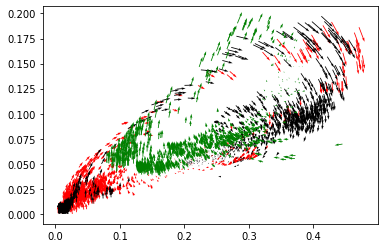

In [191]:
plt_gene(overlap_df_elavl4[0:1000],'red')
plt_gene(overlap_df_dcx[0:1000],'black')
plt_gene(overlap_df_nav1[0:1000],'green')
plt.savefig('/Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 16-14-22/compare_3gene1000points.pdf')

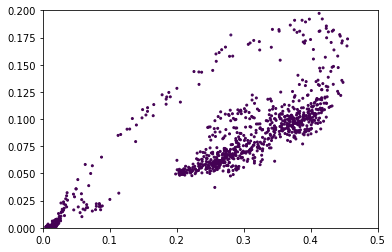

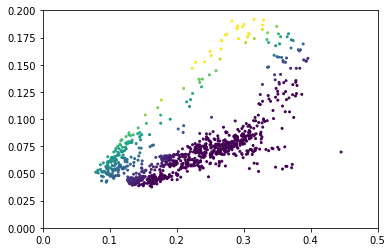

In [249]:

def plt_gene_alpha(df):
    fig, ax = plt.subplots()
    ax.scatter(df.s0,df.u0,c=df.alpha,vmin=0.1,vmax=0.20,s=4)
    ax.set_xlim(0, 0.5)
    ax.set_ylim(0, 0.2)
plt_gene_alpha(overlap_df_dcx[0:1000])

plt_gene_alpha(overlap_df_nav1[0:1000])

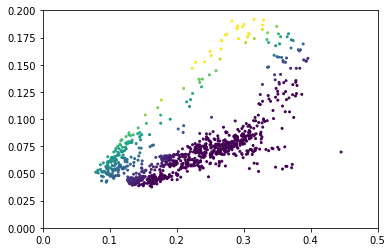

In [250]:
plt_gene_alpha(overlap_df_nav1[0:1000])


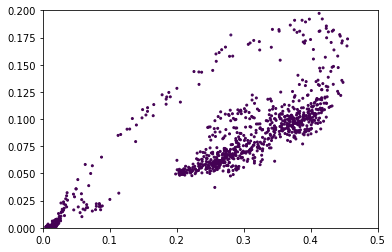

In [251]:
plt_gene_alpha(overlap_df_dcx[0:1000])

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,loss,cellID,clusters,embedding1,embedding2
0,0,Dcx,0.245465,0.063739,0.247409,0.060736,0.039016,0.706348,0.167568,0.189853,10X83_2:AAACGGGGTCTCTTTAx,ImmGranule2,18.931086,-1.862429
1,1,Dcx,0.240491,0.065521,0.243461,0.062707,0.040568,0.705058,0.167396,0.189853,10X83_2:AACCATGGTTCAACCAx,ImmGranule2,18.419891,-1.282895
2,2,Dcx,0.278555,0.059935,0.276441,0.054810,0.032482,0.712970,0.168580,0.189853,10X83_2:AACACGTTCTGAAAGAx,CA2-3-4,2.369887,16.868419
3,3,Dcx,0.403965,0.099140,0.405280,0.077301,0.028200,0.725012,0.171415,0.189853,10X83_2:AAAGATGCATTGAGCTx,CA,-5.351040,10.676485
4,4,Dcx,0.365864,0.091654,0.367689,0.073919,0.030560,0.720434,0.170500,0.189853,10X83_2:AACCATGTCTACTTACx,CA1-Sub,-6.189126,11.754900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18135,18135,Dcx,0.306420,0.074120,0.306983,0.064076,0.032867,0.714467,0.169146,0.189853,10X84_3:TTTCCTCCACCATCCTx,ImmGranule1,10.812611,-2.487668
18136,18136,Dcx,0.233129,0.040333,0.227906,0.042509,0.032977,0.709715,0.167589,0.189853,10X84_3:TTTGTCACATGAAGTAx,CA2-3-4,8.246204,23.482788
18137,18137,Dcx,0.240998,0.147585,0.271778,0.142140,0.090677,0.688197,0.166013,0.189853,10X84_3:TTTCCTCCACGGTAAGx,nIPC,-3.441272,-4.917364
18138,18138,Dcx,0.316715,0.064780,0.313126,0.055911,0.028793,0.718306,0.169585,0.189853,10X84_3:TTTGTCAAGCGTCAAGx,ImmGranule2,16.394199,-6.143549


,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,loss,cellID,clusters,embedding1,embedding2
10,10,Dcx,0.267086,0.163804,0.301340,0.155330,0.096020,0.689648,0.166462,0.189853,10X83_2:AAAGTAGGTAGCGTAGx,Nbl2,-3.228885,-3.139349
33,33,Dcx,0.272766,0.166221,0.307408,0.156922,0.096125,0.690176,0.166581,0.189853,10X83_2:AAAGCAACATGCATGTx,nIPC,-3.140659,-4.518219
44,44,Dcx,0.233270,0.131914,0.259397,0.126401,0.079970,0.689815,0.166088,0.189853,10X83_2:AAATGCCTCACATAGCx,Nbl1,-4.312332,-4.558118
58,58,Dcx,0.342868,0.182514,0.377824,0.161143,0.084873,0.699208,0.168300,0.189853,10X83_2:AAAGCAATCAGTCAGTx,Nbl2,-2.704979,-0.706020
74,74,Dcx,0.369538,0.186443,0.403851,0.160502,0.079189,0.703002,0.168977,0.189853,10X83_2:AACTGGTCAACTGCGCx,Nbl2,-2.465086,-1.474134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18094,18094,Dcx,0.380844,0.186884,0.414467,0.159070,0.076090,0.704808,0.169282,0.189853,10X84_3:TTTCCTCGTACATGTCx,Nbl2,-1.731904,-2.422407
18097,18097,Dcx,0.264626,0.152043,0.295146,0.142491,0.086029,0.691466,0.166619,0.189853,10X84_3:TTTGGTTAGTTCGCGCx,Nbl1,-5.293279,-7.079425
18114,18114,Dcx,0.377177,0.183185,0.409820,0.155763,0.074281,0.704890,0.169253,0.189853,10X84_3:TTTGTCATCGCAAGCCx,Nbl2,-1.125131,-1.797156
18116,18116,Dcx,0.217610,0.131746,0.244849,0.129236,0.085499,0.687072,0.165628,0.189853,10X84_3:TTTGTCACAAGTCTACx,Nbl2,-2.252975,-2.710126


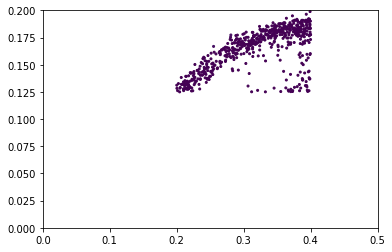

In [328]:
overlap_df_dcx_lim=overlap_df_dcx[(overlap_df_dcx.u0>0.125) & (overlap_df_dcx.u0<0.2) & (overlap_df_dcx.s0>0.2) & (overlap_df_dcx.s0<0.4)]
plt_gene_alpha(overlap_df_dcx_lim)
overlap_df_dcx_lim

In [326]:
dcx_10

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,loss,cellID,clusters,embedding1,embedding2
0,10,Dcx,0.267086,0.163804,0.301340,0.155330,0.096020,0.689648,0.166462,0.189853,10X83_2:AAAGTAGGTAGCGTAGx,Nbl2,-3.228885,-3.139349
1,33,Dcx,0.272766,0.166221,0.307408,0.156922,0.096125,0.690176,0.166581,0.189853,10X83_2:AAAGCAACATGCATGTx,nIPC,-3.140659,-4.518219
2,44,Dcx,0.233270,0.131914,0.259397,0.126401,0.079970,0.689815,0.166088,0.189853,10X83_2:AAATGCCTCACATAGCx,Nbl1,-4.312332,-4.558118
3,429,Dcx,0.278866,0.157737,0.310236,0.146066,0.085948,0.692857,0.166925,0.189853,10X83_2:ACTGATGAGCCGCCTAx,Nbl2,-3.127282,-2.569951
4,536,Dcx,0.233073,0.143338,0.263025,0.138922,0.089731,0.687623,0.165861,0.189853,10X83_2:AGATCTGGTACGCACCx,Nbl1,-4.133896,-4.753609
5,575,Dcx,0.200232,0.128305,0.227616,0.128949,0.089130,0.684629,0.165178,0.189853,10X83_2:AGCCTAAAGTGTCCATx,Nbl1,-5.649228,-6.960561
6,599,Dcx,0.225728,0.143729,0.256350,0.140901,0.092979,0.686253,0.165641,0.189853,10X83_2:AGCGGTCAGATCGGGTx,nIPC,-3.821452,-5.166073
7,664,Dcx,0.253718,0.144769,0.282618,0.136534,0.083559,0.690953,0.166438,0.189853,10X83_2:AGGCCGTGTTTCGCTCx,nIPC,-3.164288,-5.288471
8,774,Dcx,0.237163,0.143121,0.266741,0.137871,0.088022,0.688380,0.165985,0.189853,10X83_2:ATAGACCCATTCACTTx,Nbl2,-4.052458,-4.104874
9,822,Dcx,0.258590,0.159895,0.292167,0.152607,0.095577,0.688913,0.166290,0.189853,10X83_2:ATCCGAATCGTCACGGx,Nbl2,-3.879823,-3.528973


,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,loss,cellID,clusters,embedding1,embedding2
0,0,Dcx,0.267086,0.163804,0.301340,0.155330,0.096020,0.689648,0.166462,0.189853,10X83_2:AAAGTAGGTAGCGTAGx,Nbl2,-3.228885,-3.139349
1,1,Dcx,0.272766,0.166221,0.307408,0.156922,0.096125,0.690176,0.166581,0.189853,10X83_2:AAAGCAACATGCATGTx,nIPC,-3.140659,-4.518219
2,2,Dcx,0.233270,0.131914,0.259397,0.126401,0.079970,0.689815,0.166088,0.189853,10X83_2:AAATGCCTCACATAGCx,Nbl1,-4.312332,-4.558118
3,3,Dcx,0.278866,0.157737,0.310236,0.146066,0.085948,0.692857,0.166925,0.189853,10X83_2:ACTGATGAGCCGCCTAx,Nbl2,-3.127282,-2.569951
4,4,Dcx,0.233073,0.143338,0.263025,0.138922,0.089731,0.687623,0.165861,0.189853,10X83_2:AGATCTGGTACGCACCx,Nbl1,-4.133896,-4.753609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,105,Dcx,0.346153,0.181956,0.380680,0.159909,0.083252,0.699874,0.168404,0.189853,10X83_2:GGCGACTCATGCAATCx,Nbl2,-2.133771,-2.163171
106,106,Dcx,0.359919,0.182825,0.393722,0.158320,0.079344,0.702055,0.168777,0.189853,10X83_2:GGCGTGTTCCCATTATx,Nbl2,-3.076424,-1.672387
107,107,Dcx,0.342393,0.168566,0.372682,0.146265,0.073688,0.701742,0.168552,0.189853,10X83_2:GGCGACTTCTCGCTTGx,nIPC,-2.531439,-4.651217
108,108,Dcx,0.315117,0.175768,0.349847,0.159073,0.088894,0.695708,0.167629,0.189853,10X83_2:GGATGTTCAGCTCGACx,Nbl2,-2.891269,-2.865158


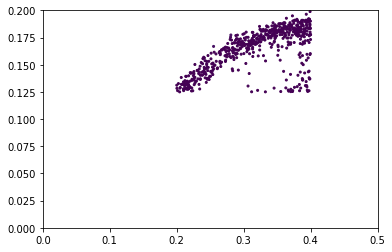

In [325]:
# overlap_df_nav1_lim=overlap_df_nav1[(overlap_df_nav1.u0>0.125) & (overlap_df_nav1.u0<0.2) & (overlap_df_nav1.s0>0.2) & (overlap_df_nav1.s0<0.4)]
# plt_gene_alpha(overlap_df_nav1_lim)
# nav_110=pd.concat([nav1_10,overlap_df_nav1_lim[0:100]],axis=0).reset_index(drop=True)
# nav_110.cellIndex=nav_110.index
# nav_110

overlap_df_dcx_lim=overlap_df_dcx[(overlap_df_dcx.u0>0.125) & (overlap_df_dcx.u0<0.2) & (overlap_df_dcx.s0>0.2) & (overlap_df_dcx.s0<0.4)]
plt_gene_alpha(overlap_df_dcx_lim)
overlap_df_dcx_lim
dcx_110=pd.concat([dcx_10,overlap_df_dcx_lim[0:100]],axis=0).reset_index(drop=True)
dcx_110.cellIndex=dcx_110.index
dcx_110

In [320]:
nav1_10

,cellIndex,gene_name,s0,u0,s1,u1,alpha,beta,gamma,loss,cellID,clusters,embedding1,embedding2
0,9,Nav1,0.237018,0.129638,0.247365,0.166816,0.163924,0.690903,0.290577,0.17481,10X83_2:AAATGCCGTCTAACGTx,nIPC,-4.861345,-8.996179
1,73,Nav1,0.210389,0.128226,0.223972,0.175029,0.181626,0.686453,0.289248,0.17481,10X83_2:AACTCAGGTAACGTTCx,nIPC,-5.620782,-8.820575
2,141,Nav1,0.251501,0.158364,0.269464,0.207175,0.206571,0.687967,0.290350,0.17481,10X83_2:AAGTCTGTCGTCACGGx,Nbl1,-5.504790,-8.488530
3,257,Nav1,0.223027,0.146650,0.241011,0.199635,0.206456,0.685219,0.289291,0.17481,10X83_2:ACACCAAAGTCCATACx,Nbl1,-6.291239,-6.683427
4,326,Nav1,0.258706,0.144433,0.271006,0.181399,0.173863,0.691884,0.291187,0.17481,10X83_2:ACCCACTCAGGAATGCx,nIPC,-3.872441,-9.168150
5,330,Nav1,0.266103,0.164537,0.284110,0.211360,0.207069,0.689335,0.290887,0.17481,10X83_2:ACCCACTTCTAGCACAx,Nbl1,-5.689952,-4.068529
6,367,Nav1,0.233573,0.136366,0.246664,0.178385,0.177999,0.689033,0.290179,0.17481,10X83_2:ACGTCAACACGTCTCTx,nIPC,-4.623820,-9.005502
7,368,Nav1,0.234379,0.133675,0.246454,0.173912,0.172667,0.689681,0.290309,0.17481,10X83_2:ACGTCAAGTTCGGGCTx,nIPC,-3.919621,-9.468739
8,450,Nav1,0.248780,0.140667,0.261198,0.179245,0.174340,0.690875,0.290806,0.17481,10X83_2:ACTGAGTCAAACGCGAx,nIPC,-4.893572,-9.003426
9,544,Nav1,0.228317,0.152106,0.247387,0.206666,0.213328,0.685103,0.289371,0.17481,10X83_2:AGAGCGATCGCCCTTAx,Nbl1,-5.885555,-7.579806


In [265]:
overlap_df_nav1_lim[0:10].to_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 16-14-22/nav1.csv',index=False)

overlap_df_dcx_lim[0:10].to_csv('/Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 16-14-22/dcx.csv',index=False)


nav1_10=overlap_df_nav1_lim[0:10]
dcx_10=overlap_df_dcx_lim[0:10]




In [302]:
nav1_5=overlap_df_nav1_lim[0:5].reset_index(drop=True)
dcx_5=overlap_df_dcx_lim[0:5].reset_index(drop=True)

epoch100check_n10Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNFalsecostTaverageavgW10smoW0.1p3binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 14-53-51 as the output path.
Rgs20
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


Velocity Estimation:   0%|                                | 0/1 [00:00<?, ?it/s]

Nav1
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Ntrk2
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Elavl4
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Dcx
circle


Velocity Estimation: 100%|████████████████████████| 1/1 [00:18<00:00, 18.68s/it]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


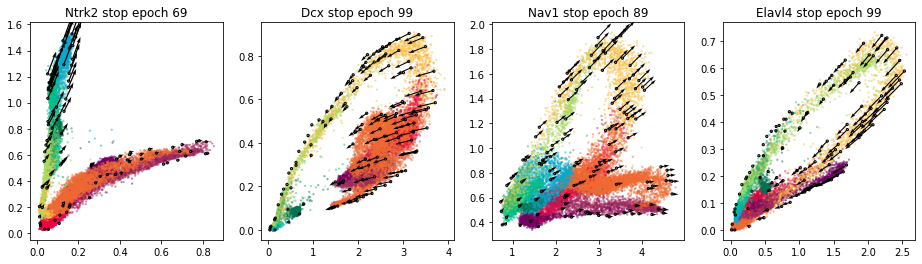

In [117]:
%autoreload 2
for max_epoches in [100]:
    for check_n_epoch in [10]:
        for learning_rate in [0.001]:
            for downsample_method in ['neighbors']:
                for step_i in [200]:
                    for step_j in [200]:
                        for sampling_ratio in [0.125]:
                            for n_neighbors in [30]:
                                for optimizer in ['Adam']:
                                    for n_neighbors_downsample in [30]:
                                        for auto_downsample in [True]:
                                            for auto_norm_u_s in [False]:
                                                for cost_type in ['average']:#,'average','median']:
                                                    for average_cost_window_size in [10]:
                                                        for smooth_weight in [0.1]:#,0.8,0.7,0.6]:#0.1
                                                            for patience in [3]:
                                                                for binning in [False]:
                                                                    velocity_calc()

epoch300check_n10Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNFalsecostTaverageavgW10smoW0.1p3binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 13-37-26 as the output path.


Velocity Estimation: 100%|████████████████████████| 1/1 [00:11<00:00, 11.09s/it]


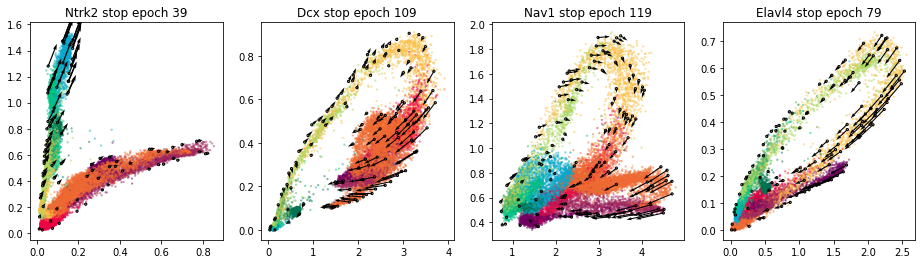

In [38]:
%autoreload 2
for max_epoches in [300]:
    for check_n_epoch in [10]:
        for learning_rate in [0.001]:
            for downsample_method in ['neighbors']:
                for step_i in [200]:
                    for step_j in [200]:
                        for sampling_ratio in [0.125]:
                            for n_neighbors in [30]:
                                for optimizer in ['Adam']:
                                    for n_neighbors_downsample in [30]:
                                        for auto_downsample in [True]:
                                            for auto_norm_u_s in [False]:
                                                for cost_type in ['average']:#,'average','median']:
                                                    for average_cost_window_size in [10]:
                                                        for smooth_weight in [0.1]:#,0.8,0.7,0.6]:#0.1
                                                            for patience in [3]:
                                                                for binning in [False]:
                                                                    velocity_calc()

epoch300check_n10Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNFalsecostTaverageavgW10smoW0.1p3binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 13-38-53 as the output path.


Velocity Estimation: 100%|████████████████████████| 1/1 [00:09<00:00,  9.88s/it]


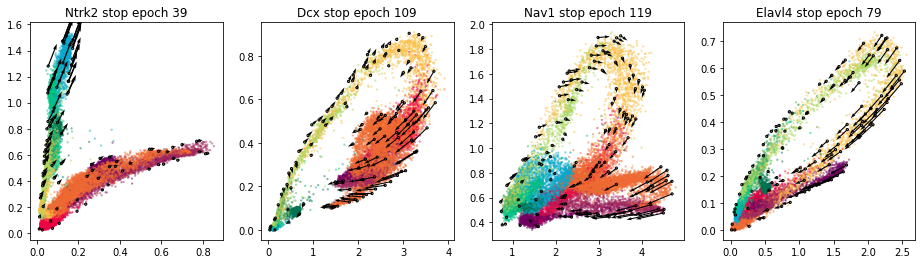

In [39]:
%autoreload 2
for max_epoches in [300]:
    for check_n_epoch in [10]:
        for learning_rate in [0.001]:
            for downsample_method in ['neighbors']:
                for step_i in [200]:
                    for step_j in [200]:
                        for sampling_ratio in [0.125]:
                            for n_neighbors in [30]:
                                for optimizer in ['Adam']:
                                    for n_neighbors_downsample in [30]:
                                        for auto_downsample in [True]:
                                            for auto_norm_u_s in [False]:
                                                for cost_type in ['average']:#,'average','median']:
                                                    for average_cost_window_size in [10]:
                                                        for smooth_weight in [0.1]:#,0.8,0.7,0.6]:#0.1
                                                            for patience in [3]:
                                                                for binning in [False]:
                                                                    velocity_calc()

epoch2check_n1Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNFalsecostTaverageavgW10smoW0.1p3binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 13-46-03 as the output path.


Velocity Estimation: 100%|████████████████████████| 1/1 [00:05<00:00,  5.90s/it]


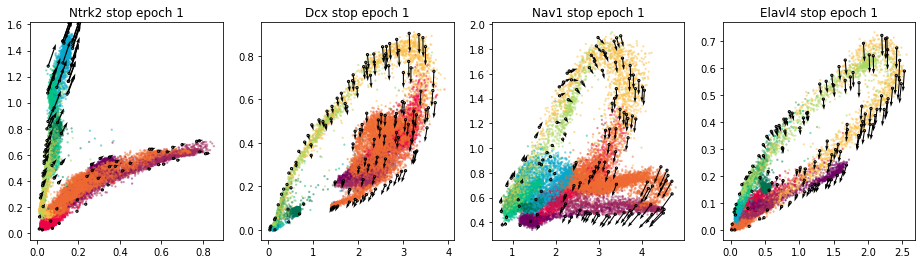

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


In [43]:
%autoreload 2
for max_epoches in [2]:
    for check_n_epoch in [1]:
        for learning_rate in [0.001]:
            for downsample_method in ['neighbors']:
                for step_i in [200]:
                    for step_j in [200]:
                        for sampling_ratio in [0.125]:
                            for n_neighbors in [30]:
                                for optimizer in ['Adam']:
                                    for n_neighbors_downsample in [30]:
                                        for auto_downsample in [True]:
                                            for auto_norm_u_s in [False]:
                                                for cost_type in ['average']:#,'average','median']:
                                                    for average_cost_window_size in [10]:
                                                        for smooth_weight in [0.1]:#,0.8,0.7,0.6]:#0.1
                                                            for patience in [3]:
                                                                for binning in [False]:
                                                                    velocity_calc()

## with norm

epoch300check_n10Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNTruecostTaverageavgW10smoW0.1p3binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 13-43-23 as the output path.


Velocity Estimation: 100%|████████████████████████| 1/1 [00:10<00:00, 10.74s/it]


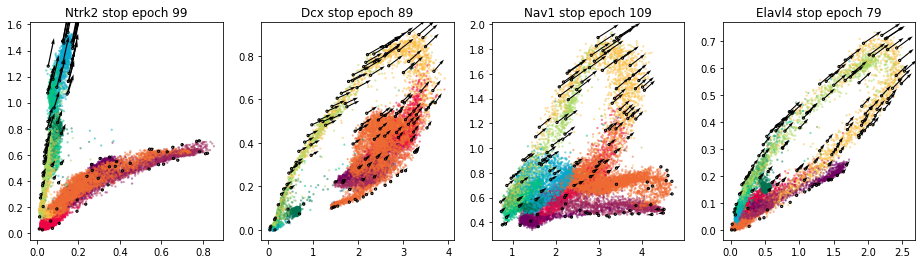

In [41]:
%autoreload 2
for max_epoches in [300]:
    for check_n_epoch in [10]:
        for learning_rate in [0.001]:
            for downsample_method in ['neighbors']:
                for step_i in [200]:
                    for step_j in [200]:
                        for sampling_ratio in [0.125]:
                            for n_neighbors in [30]:
                                for optimizer in ['Adam']:
                                    for n_neighbors_downsample in [30]:
                                        for auto_downsample in [True]:
                                            for auto_norm_u_s in [True]:
                                                for cost_type in ['average']:#,'average','median']:
                                                    for average_cost_window_size in [10]:
                                                        for smooth_weight in [0.1]:#,0.8,0.7,0.6]:#0.1
                                                            for patience in [3]:
                                                                for binning in [False]:
                                                                    velocity_calc()

epoch2check_n1Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNTruecostTaverageavgW10smoW0.1p3binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 13-44-10 as the output path.
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


Velocity Estimation: 100%|████████████████████████| 1/1 [00:06<00:00,  6.06s/it]


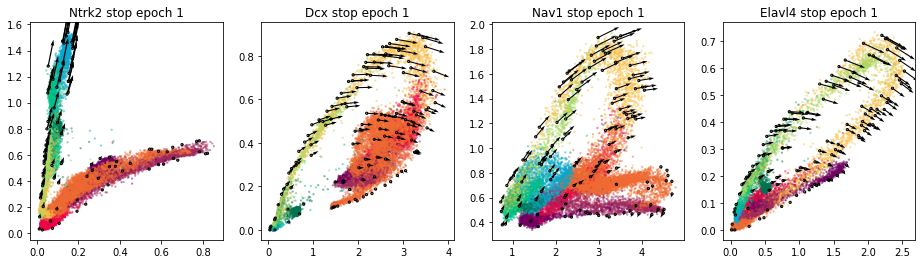

In [42]:
%autoreload 2
for max_epoches in [2]:
    for check_n_epoch in [1]:
        for learning_rate in [0.001]:
            for downsample_method in ['neighbors']:
                for step_i in [200]:
                    for step_j in [200]:
                        for sampling_ratio in [0.125]:
                            for n_neighbors in [30]:
                                for optimizer in ['Adam']:
                                    for n_neighbors_downsample in [30]:
                                        for auto_downsample in [True]:
                                            for auto_norm_u_s in [True]:
                                                for cost_type in ['average']:#,'average','median']:
                                                    for average_cost_window_size in [10]:
                                                        for smooth_weight in [0.1]:#,0.8,0.7,0.6]:#0.1
                                                            for patience in [3]:
                                                                for binning in [False]:
                                                                    velocity_calc()

epoch300check_n10Lr0.001Downneighbors_200_200Ratio0.125N30OAdamnD30autoDTrueautoNTruecostTaverageavgW10smoW0.1p3binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 13-49-29 as the output path.
Rgs20
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


Velocity Estimation:   0%|                                | 0/1 [00:00<?, ?it/s]

Nav1
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Ntrk2
branch
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Elavl4
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
Dcx
circle


Velocity Estimation: 100%|████████████████████████| 1/1 [00:22<00:00, 22.02s/it]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


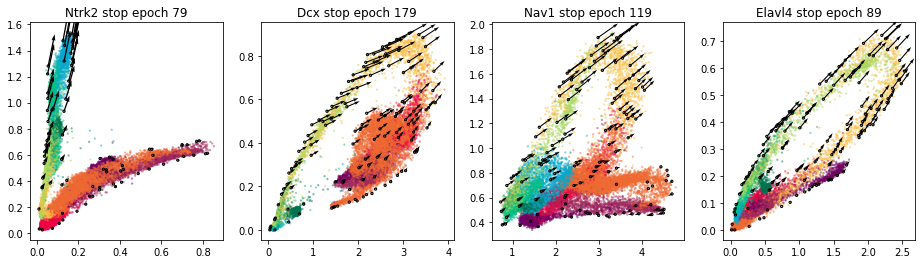

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------
---------------------------------------------

In [45]:
%autoreload 2
for max_epoches in [300]:
    for check_n_epoch in [10]:
        for learning_rate in [0.001]:
            for downsample_method in ['neighbors']:
                for step_i in [200]:
                    for step_j in [200]:
                        for sampling_ratio in [0.125]:
                            for n_neighbors in [30]:
                                for optimizer in ['Adam']:
                                    for n_neighbors_downsample in [30]:
                                        for auto_downsample in [True]:
                                            for auto_norm_u_s in [True]:
                                                for cost_type in ['average']:#,'average','median']:
                                                    for average_cost_window_size in [10]:
                                                        for smooth_weight in [0.1]:#,0.8,0.7,0.6]:#0.1
                                                            for patience in [3]:
                                                                for binning in [False]:
                                                                    velocity_calc()

## sulf2 test

In [47]:
%autoreload 2

raw_path="/Users/shengyuli/Library/CloudStorage/OneDrive-HoustonMethodist/work/Velocity/data/raw_data/DentateGyrus.csv"
raw_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/raw_data/DentateGyrus.csv'
raw_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/raw_data/PancreaticEndocrinogenesis.csv'
load_raw_data_pan=pd.read_csv(raw_path)

In [131]:
load_raw_data_pan

,gene_name,u0,s0,cellID,clusters,embedding1,embedding2
0,Sntg1,0.045809,0.000000,Pre-endocrine,AAACCTGAGAGGGATA,6.143066,-0.063644
1,Sntg1,0.058600,0.000000,Ductal,AAACCTGAGCCTTGAT,-9.906417,0.197778
2,Sntg1,0.058696,0.000000,Alpha,AAACCTGAGGCAATTA,7.559791,0.583762
3,Sntg1,0.198549,0.000000,Ductal,AAACCTGCATCATCCC,-11.283765,4.218998
4,Sntg1,0.000000,0.000000,Ngn3 high EP,AAACCTGGTAAGTGGC,1.721565,-4.753407
...,...,...,...,...,...,...,...
7391995,Erdr1,0.461130,0.505213,Pre-endocrine,TTTGTCAAGTGACATA,4.768472,-1.388353
7391996,Erdr1,0.643907,0.531752,Ngn3 high EP,TTTGTCAAGTGTGGCA,-1.873335,-4.182650
7391997,Erdr1,0.626258,0.406073,Ductal,TTTGTCAGTTGTTTGG,-9.882250,-0.105594
7391998,Erdr1,0.409493,0.514864,Alpha,TTTGTCATCGAATGCT,6.612424,4.531895


In [138]:
%autoreload 2


max_epoches=3
check_n_epoch=1
learning_rate=0.001#0.001
downsample_method='neighbors'
step_i=200
step_j=200
sampling_ratio=1
n_neighbors=30
optimizer='Adam'
n_neighbors_downsample=30
auto_downsample=True
auto_norm_u_s=False
cost_type='smooth'
smooth_weight=0.1#0.1
patience=5
binning=True

def velocity_calc_pan(load_raw_data_pan):
    # gene_list=load_raw_data.gene_name.drop_duplicates()


    folder_name=("epoch"+str(max_epoches)+"check_n"+str(check_n_epoch)+"Lr"+str(learning_rate)+"Down"+str(downsample_method)+"_"+str(step_i)+"_"+str(step_j)+"Ratio"+str(sampling_ratio)+"N"+str(n_neighbors)+"O"+str(optimizer)+"nD"+str(n_neighbors_downsample)+"autoD"+str(auto_downsample)+"autoN"+str(auto_norm_u_s)+"costT"+str(cost_type)+'avgW'+str(average_cost_window_size)+"smoW"+str(smooth_weight)+"p"+str(patience)+"bin"+str(binning))
    print(folder_name)
    # result_path = '/Users/wanglab/Documents/ShengyuLi/Velocity/data/Gastrulation/velocity_result/result_detailcsv/tunning_train/'+folder_name+'/'
    # os.mkdir(result_path)
    result_path = None

    # Velocity Estimation
    brief_pan, load_cellDancer_pan=velocity_estimation.train(load_raw_data_pan,\
                                                     gene_choice=gene_list,\
                                                     max_epoches=max_epoches,\
                                                     check_n_epoch=check_n_epoch,\
                                                     learning_rate=learning_rate, \
                                                     downsample_method=downsample_method,\
                                                     step_i=step_i,\
                                                     step_j=step_j,\
                                                     sampling_ratio=sampling_ratio,\
                                                     n_neighbors=n_neighbors,\
                                                     optimizer=optimizer,\
                                                     n_neighbors_downsample=n_neighbors_downsample,\
                                                     auto_downsample=auto_downsample,\
                                                     auto_norm_u_s=auto_norm_u_s,\
                                                     cost_type=cost_type,\
                                                     average_cost_window_size=average_cost_window_size,\
                                                     smooth_weight=smooth_weight,\
                                                     patience=patience,\
                                                     binning=binning,\
                                                     result_path=result_path,n_jobs=1)
    #print(load_cellDancer_pan)
    # for gene in gene_list:
    #     onegene=brief[brief.gene_name==gene]
    #     plt.figure()
    #     plt.scatter(onegene.epoch,onegene.loss)
    #     plt.title(gene)
    #     plt.show()
    
    #onegene.loss
    ## Sample Genes' Velocity Plot

    #ncols=5
    #fig = plt.figure(figsize=(20,4))
    plt.quiver(load_cellDancer_pan.s0,load_cellDancer_pan.u0,load_cellDancer_pan.s1-load_cellDancer_pan.s0,load_cellDancer_pan.u1-load_cellDancer_pan.u0)
    # for i in range(len(gene_list)):
    #     ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
    #     cdplt.gene.scatter_gene(
    #         ax=ax,
    #         x='spliced',
    #         y='unspliced',
    #         load_cellDancer=load_cellDancer_pan,
    #         save_path=None,
    #         custom_xlim=None,
    #         custom_ylim=None,
    #         colors=colormap.colormap_pancreas,
    #         alpha=0.5, 
    #         s = 5,
    #         velocity=True,
    #         gene_name=gene_list[i])
    #     gene=gene_list[i]
    #     onegene=brief_pan[brief_pan.gene_name==gene]
    #     end_epoch=str(list(onegene.epoch)[-1])
    #     ax.set_title(gene_list[i]+' stop epoch '+end_epoch)
    plt.show()
    #plt.savefig('/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/debug_circle/'+folder_name+'.pdf')

epoch3check_n1Lr0.001Downneighbors_200_200Ratio1N30OAdamnD30autoDTrueautoNFalsecostTsmoothavgW10smoW0.1p5binTrue
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 15-39-49 as the output path.
Sntg1
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


Velocity Estimation:   0%|                                | 0/1 [00:00<?, ?it/s]

Sulf2
circle


Velocity Estimation: 100%|████████████████████████| 1/1 [00:00<00:00,  1.00it/s]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


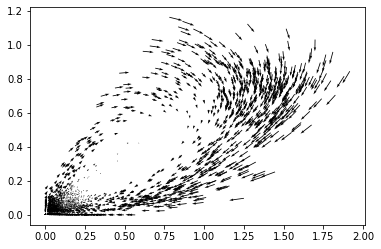

In [139]:
gene_list=['Sulf2']
gene_list
velocity_calc_pan(load_raw_data_pan)

In [168]:
import numpy as np
nx, ny = (2, 3)
x = np.linspace(0, 1, nx)
y = np.linspace(0, 1, ny)
xv, yv = np.meshgrid(x, y)
xv

array([[0., 1.],
       [0., 1.],
       [0., 1.]])

In [151]:
%autoreload 2

raw_path='/Users/wanglab/Documents/ShengyuLi/Velocity/data/neuro/velocity_result/test_circle_model_load/test.csv'
load_raw_data_designed=pd.read_csv(raw_path)


In [152]:
load_raw_data_designed

,gene_name,u0,s0,clusters,cellID,embedding1,embedding2
0,Sntg1,0.1,0.1,Pre-endocrine,1,0.1,0.1
1,Sntg1,0.1,0.2,Pre-endocrine,2,0.1,0.2
2,Sntg1,0.1,0.3,Pre-endocrine,3,0.1,0.3
3,Sntg1,0.1,0.4,Pre-endocrine,4,0.1,0.4
4,Sntg1,0.1,0.5,Pre-endocrine,5,0.1,0.5
...,...,...,...,...,...,...,...
95,Sntg1,1.0,0.6,Pre-endocrine,96,1.0,0.6
96,Sntg1,1.0,0.7,Pre-endocrine,97,1.0,0.7
97,Sntg1,1.0,0.8,Pre-endocrine,98,1.0,0.8
98,Sntg1,1.0,0.9,Pre-endocrine,99,1.0,0.9


epoch2check_n1Lr0.001Downneighbors_200_200Ratio1N30OAdamnD30autoDFalseautoNFalsecostTsmoothavgW10smoW0.1p5binFalse
Using /Users/wanglab/Documents/ShengyuLi/Velocity/bin/celldancer_polish/analysis/cell_dancer_velocity_2022-05-05 15-58-36 as the output path.
Sntg1
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


Velocity Estimation: 100%|████████████████████████| 1/1 [00:00<00:00, 16.55it/s]

Sntg1
circle
--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{}
--------------------------------------------------------------------------------


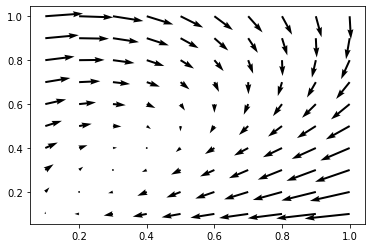

In [158]:
gene_list=['Sntg1']

max_epoches=2
check_n_epoch=1
learning_rate=0.001#0.001
downsample_method='neighbors'
step_i=200
step_j=200
sampling_ratio=1
n_neighbors=30
optimizer='Adam'
n_neighbors_downsample=30
auto_downsample=False
auto_norm_u_s=False
cost_type='smooth'
smooth_weight=0.1#0.1
patience=5
binning=False

velocity_calc_pan(load_raw_data_designed)